# 04: Evaluation

This Jupyter Notebook shows an evaluation of multiple synthetic dataset generated using different type of Generative Adversarial Networks (GANs). We compare the synthetic dataset with the original [WESAD](https://ubicomp.eti.uni-siegen.de/home/datasets/icmi18/) dataset it is based on. The evaluation is performed using different quality assesment options in terms of synthetic data based on the work of [Ehrhart et al.](https://www.mdpi.com/1424-8220/22/16/5969)

EVALUATION: QUALITY ASSESSMENT OPTIONS

1. Diversity (Visual Evaluation):
    samples should be as distributed as the real data points
Visualization by t-SNE und PCA

2. Fidelity (Statistical Evaluation):
samples should be indistinguishable from real points
Quantitative measure of equality
Train a binary classifier that distinguishes real data points from generated data points. Original sequence is labeled as real; any generated sequence is labeled as not real.
3. Usefulness (TSTR): evaluate how well the generated data preserves the predictive characteristics of the original
Train on synthetic, test on real (TSTR) framework

In [105]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [1]:
save_figs = False

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
from stress_slurm.config import GAN_CONFIG, REAL_PATH, RESULTS_FOLDER_PATH
GAN_CONFIG.pop("noGAN", None)
GAN_CONFIG.pop("TIMEGAN", None)
path, filename = os.path.split(REAL_PATH)
WESAD_PATH = os.path.join(path, "wesad_windows.npy")
RESULTS_PATH = RESULTS_FOLDER_PATH + "/plots/data_quality"

In [4]:
SIGTOI = {"BVP": 0, "EDA": 1, "ACC_x": 2, "ACC_y": 3, "ACC_z": 4, "TEMP": 5}
ITOSIG = {0: 'BVP', 1: 'EDA', 2: 'ACC_x', 3: 'ACC_y', 4: 'ACC_z', 5: 'TEMP'}
SAMPLING_RATE = 1
label_index = 6

In [5]:
def split_by_majority_class(dataset, label_index):

    mos_mask = np.sum(dataset[:, :, label_index] == 1, axis=1) > dataset.shape[1] / 2
    mos = dataset[mos_mask]

    non_mos_mask = np.sum(dataset[:, :, label_index] == 0, axis=1) > dataset.shape[1] / 2
    non_mos = dataset[non_mos_mask]

    return mos, non_mos

In [6]:
windows = {"WESAD": {}}
windows["WESAD"]["full"] = np.load(WESAD_PATH) # np.load('data/wesad/wesad_windows.npy') # load wesad from saved np array
windows["WESAD"]["mos"], windows["WESAD"]["non_mos"] = split_by_majority_class(windows["WESAD"]["full"], label_index)
windows["WESAD"]["name"] = "WESAD"

for gan_mode in GAN_CONFIG.keys():
    windows[gan_mode] = {}
    syn_data = None
    if gan_mode == "TIMEGAN": # load timegan gan data from saved np array
        with open(GAN_CONFIG[gan_mode]["path"], "rb") as f:
            syn_data = np.load(f)
    else: # load other gan data from saved csv files
        syn_df = pd.read_csv(GAN_CONFIG[gan_mode]["path"], index_col=0)
        sid_max = 1000 + 15 # 15 synthetic subjects
        syn_df = syn_df[syn_df["sid"] <= sid_max].drop(columns=["sid"])
        syn_data = syn_df.to_numpy()
        syn_data = syn_data.reshape(-1, 60, syn_data.shape[-1])
    windows[gan_mode]["full"] = syn_data
    windows[gan_mode]["mos"], windows[gan_mode]["non_mos"] = split_by_majority_class(syn_data, label_index)
    windows[gan_mode]["name"] = GAN_CONFIG[gan_mode]["name"]

WESAD
            BVP       EDA     ACC_x     ACC_y     ACC_z      TEMP  Label
0      0.346210  1.000000  0.739452  0.461699  0.689519  0.955839    0.0
1      0.594455  0.977662  0.715105  0.325097  0.718060  0.953973    0.0
2      0.495986  0.973092  0.625460  0.361836  0.780076  0.958947    0.0
3      0.526112  0.960576  0.642609  0.329826  0.763401  0.961039    0.0
4      0.575111  0.940889  0.641003  0.352274  0.769356  0.960800    0.0
...         ...       ...       ...       ...       ...       ...    ...
64975  0.495800  0.102047  0.339193  0.535402  0.779401  0.401605    1.0
64976  0.402552  0.102572  0.321153  0.536162  0.781888  0.401612    1.0
64977  0.380136  0.100742  0.335518  0.533296  0.777240  0.405900    1.0
64978  0.416021  0.098675  0.320961  0.536751  0.781632  0.417450    1.0
64979  0.456401  0.101076  0.335916  0.536465  0.778576  0.413323    1.0

[64980 rows x 7 columns]


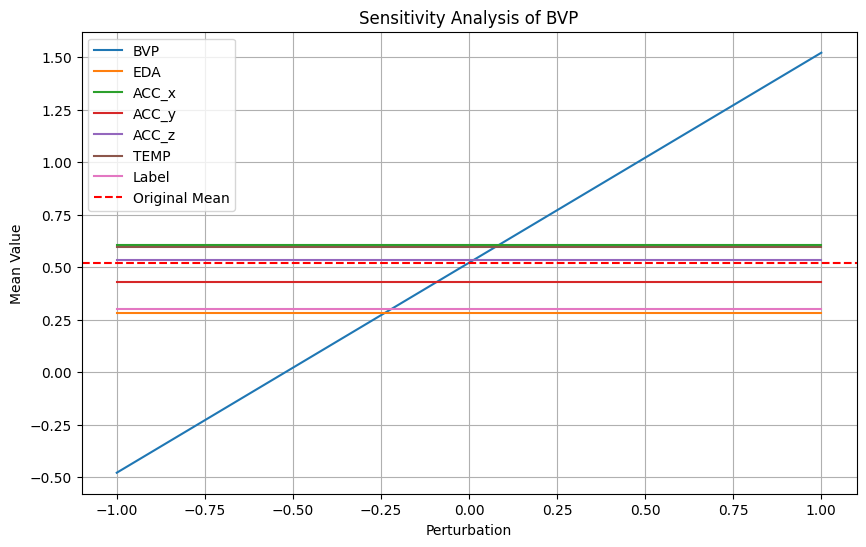

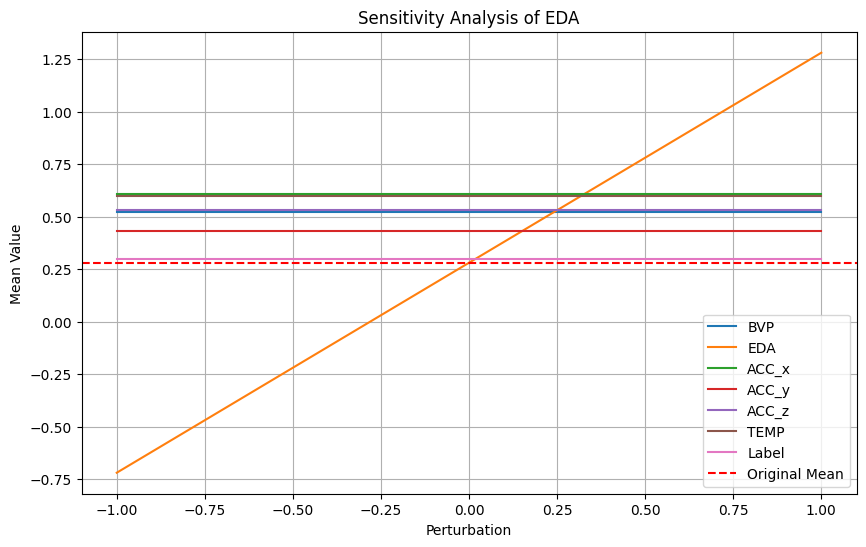

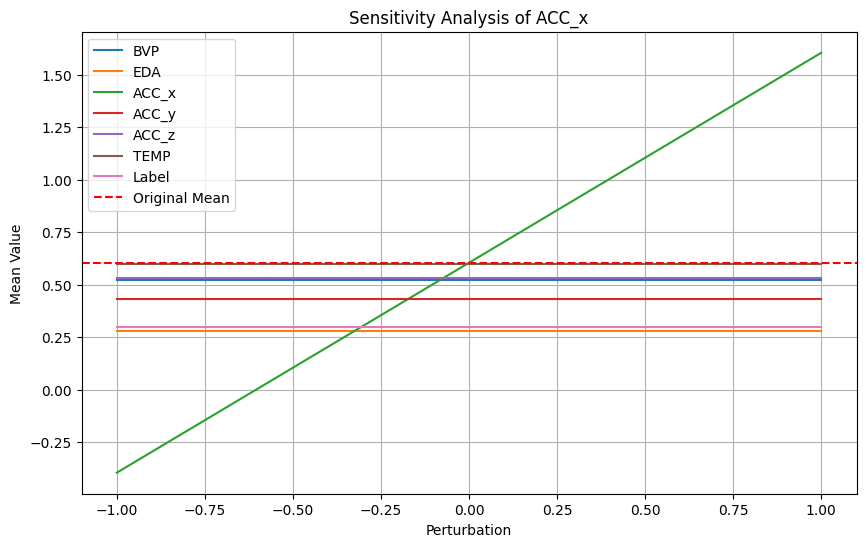

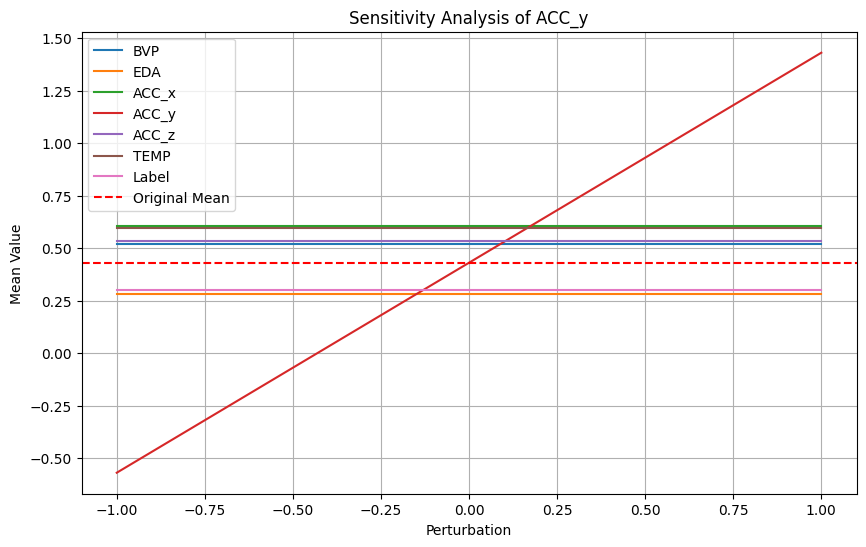

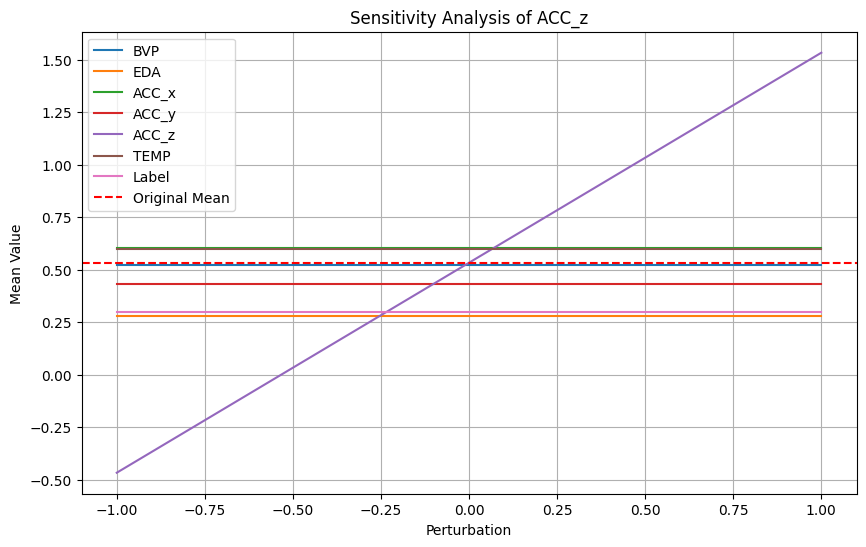

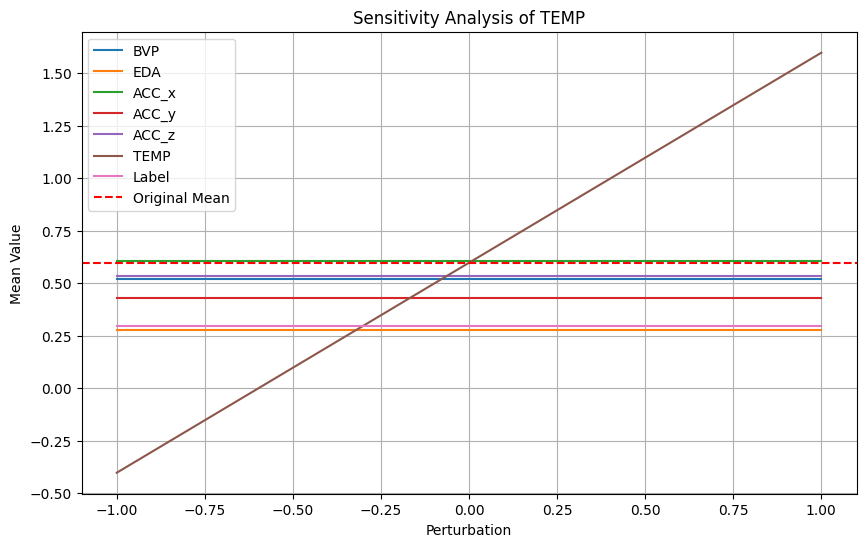

In [7]:
plt.style.use('default')
def sensitivity_analysis(dataframe, signal_name, perturbation_range):
    """
    Perform sensitivity analysis on a specified signal within a dataframe.
    
    :param dataframe: Pandas DataFrame containing the signals
    :param signal_name: The name of the signal column to analyze
    :param perturbation_range: Range of values to perturb the signal by
    """
    original_mean = dataframe.mean()
    perturbed_means = []

    for perturbation in perturbation_range:
        perturbed_df = dataframe.copy()
        perturbed_df[signal_name] += perturbation
        perturbed_mean = perturbed_df.mean()
        perturbed_means.append(perturbed_mean)
    
    # Plotting
    plt.figure(figsize=(10, 6))
    for signal in dataframe.columns:
        means = [mean[signal] for mean in perturbed_means]
        plt.plot(perturbation_range, means, label=signal)
    
    plt.axhline(y=original_mean[signal_name], color='r', linestyle='--', label='Original Mean')
    plt.title(f'Sensitivity Analysis of {signal_name}')
    plt.xlabel('Perturbation')
    plt.ylabel('Mean Value')
    plt.legend()
    plt.grid(True)
    plt.show()

#for i, signal in ITOSIG.items():
#print(windows["WESAD"]["full"])
columns = ['BVP', 'EDA', 'ACC_x', 'ACC_y', 'ACC_z', 'TEMP', 'Label'] 
titles, dfs = [], []

for key, value in windows.items():
    titles.append(windows[key]["name"])
    dfs.append(pd.DataFrame(windows[key]["full"].reshape(-1, windows[key]["full"].shape[-1]), columns=columns))

idx = 0
title = titles[idx]
data_df = dfs[idx]
print(title)
print(data_df)

for signal in columns[:-1]:
    sensitivity_analysis(data_df, signal, np.linspace(-1, 1, 20))

WESAD
            BVP       EDA     ACC_x     ACC_y     ACC_z      TEMP  Label
0      0.346210  1.000000  0.739452  0.461699  0.689519  0.955839    0.0
1      0.594455  0.977662  0.715105  0.325097  0.718060  0.953973    0.0
2      0.495986  0.973092  0.625460  0.361836  0.780076  0.958947    0.0
3      0.526112  0.960576  0.642609  0.329826  0.763401  0.961039    0.0
4      0.575111  0.940889  0.641003  0.352274  0.769356  0.960800    0.0
...         ...       ...       ...       ...       ...       ...    ...
64975  0.495800  0.102047  0.339193  0.535402  0.779401  0.401605    1.0
64976  0.402552  0.102572  0.321153  0.536162  0.781888  0.401612    1.0
64977  0.380136  0.100742  0.335518  0.533296  0.777240  0.405900    1.0
64978  0.416021  0.098675  0.320961  0.536751  0.781632  0.417450    1.0
64979  0.456401  0.101076  0.335916  0.536465  0.778576  0.413323    1.0

[64980 rows x 7 columns]
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count,

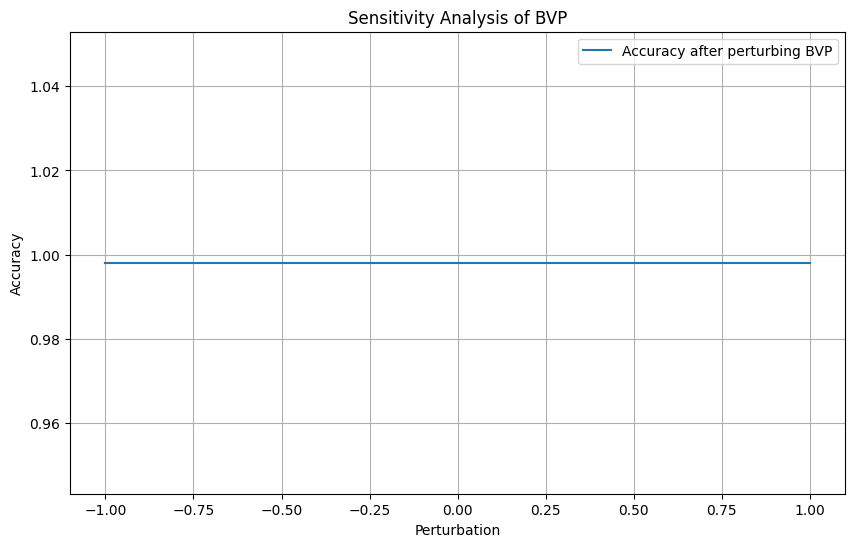

Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dty

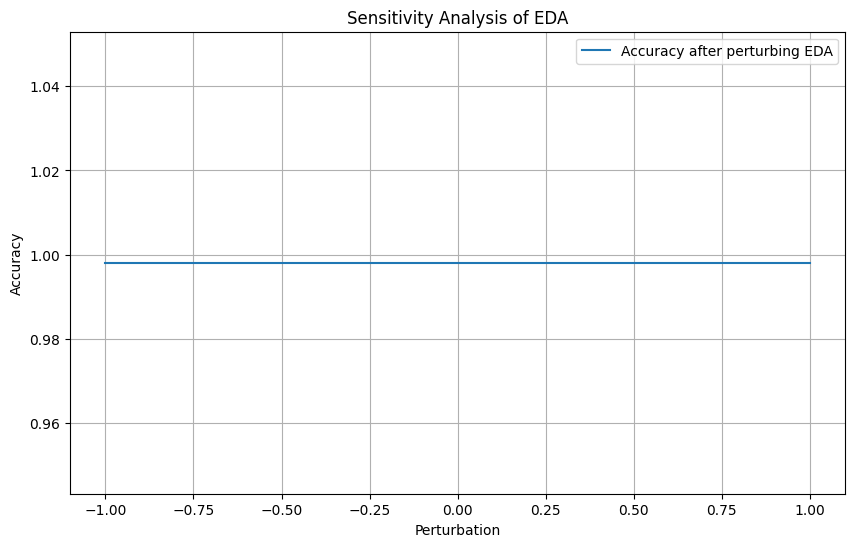

Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dty

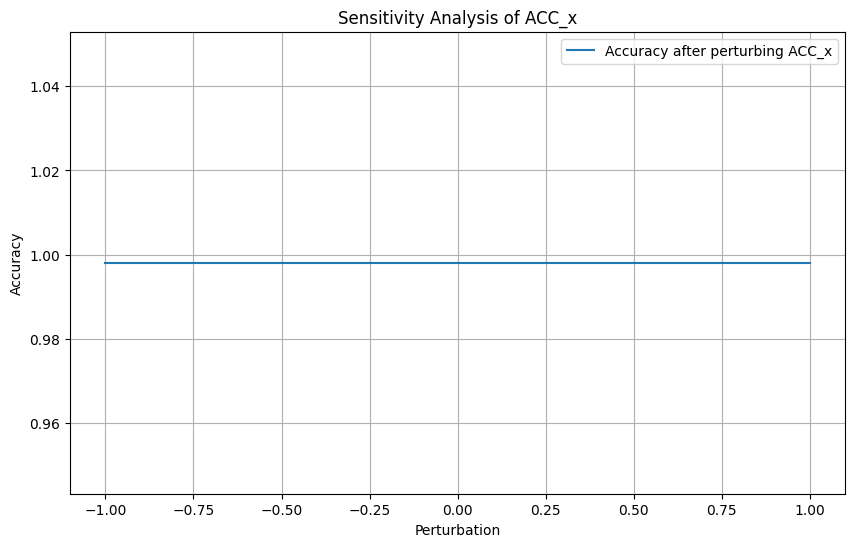

Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dty

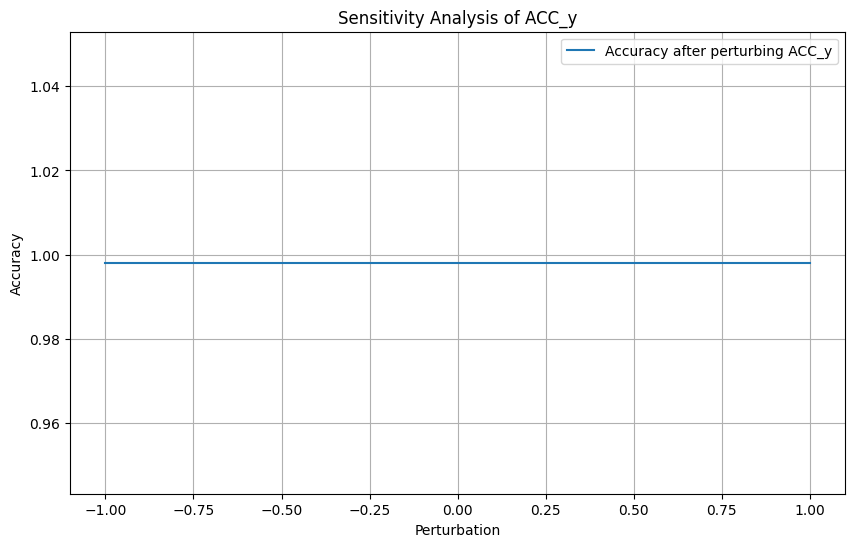

Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dty

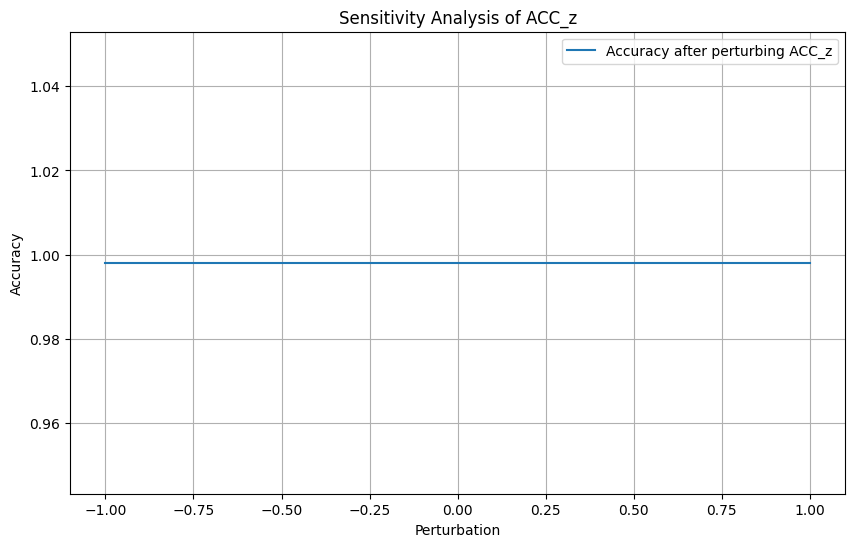

Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dtype: int64 0.0    9097
1.0    3899
Name: count, dtype: int64
Label
0.0    9104
1.0    3892
Name: count, dty

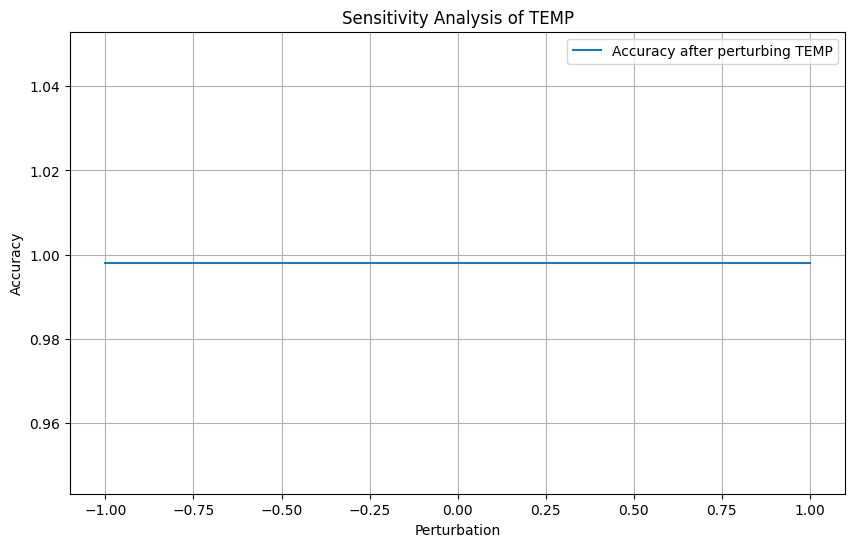

In [8]:
# plt.style.use('default')

# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# def sensitivity_analysis_acc(dataframe, signal_name, perturbation_range):
#     """
#     Perform sensitivity analysis on a specified signal within a dataframe.
    
#     :param dataframe: Pandas DataFrame containing the signals
#     :param signal_name: The name of the signal column to analyze
#     :param perturbation_range: Range of values to perturb the signal by
#     """
#     original_accuracy = []
#     perturbed_accuracy = []

#     for perturbation in perturbation_range:
#         perturbed_df = dataframe.copy()
#         perturbed_df[signal_name] += perturbation
        
#         # Splitting the dataset into training and testing sets
#         X = perturbed_df.drop('Label', axis=1)
#         y = perturbed_df['Label']
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)
        
#         # Feature scaling
#         scaler = StandardScaler()
#         X_train = scaler.fit_transform(X_train)
#         X_test = scaler.transform(X_test)
        
#         # Training a RandomForestClassifier
#         classifier = RandomForestClassifier(n_estimators=10, random_state=42)
#         classifier.fit(X_train, y_train)
#         y_pred = classifier.predict(X_test)
        
#         # Calculating accuracy
#         accuracy = accuracy_score(y_test, y_pred)
#         f1 = f1_score(y_test, y_pred)
#         print(y_test.value_counts(), pd.DataFrame(y_pred).value_counts())
#         perturbed_accuracy.append(f1)
    
#     # Plotting
#     plt.figure(figsize=(10, 6))
#     plt.plot(perturbation_range, perturbed_accuracy, label=f'Accuracy after perturbing {signal_name}')
#     plt.title(f'Sensitivity Analysis of {signal_name}')
#     plt.xlabel('Perturbation')
#     plt.ylabel('Accuracy')
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# #for i, signal in ITOSIG.items():
# #print(windows["WESAD"]["full"])
# columns = ['BVP', 'EDA', 'ACC_x', 'ACC_y', 'ACC_z', 'TEMP', 'Label'] 
# titles, dfs = [], []

# for key, value in windows.items():
#     titles.append(windows[key]["name"])
#     dfs.append(pd.DataFrame(windows[key]["full"].reshape(-1, windows[key]["full"].shape[-1]), columns=columns))

# idx = 0
# title = titles[idx]
# data_df = dfs[idx]
# print(title)
# print(data_df)

# for signal in columns[:-1]:
#     sensitivity_analysis_acc(data_df, signal, np.linspace(-1, 1, 20))

### 1. Diversity

- Assessing the diversity and distribution of synthetic data is crucial in its evaluation.
- Principal Component Analysis (PCA) and t-Distributed Stochastic Neighbor Embedding (t-SNE) are employed for visual evaluation.
- PCA reduces dimensionality while preserving significant variance, enabling comparison of synthetic and real data distributions through plots.
- t-SNE reveals local structures and patterns, generating plots that highlight similarities and differences between synthetic and real datasets.
- Successful synthetic data generation should exhibit well-distributed points mixed among the clusters of the original data, indicating satisfactory diversity preservation.

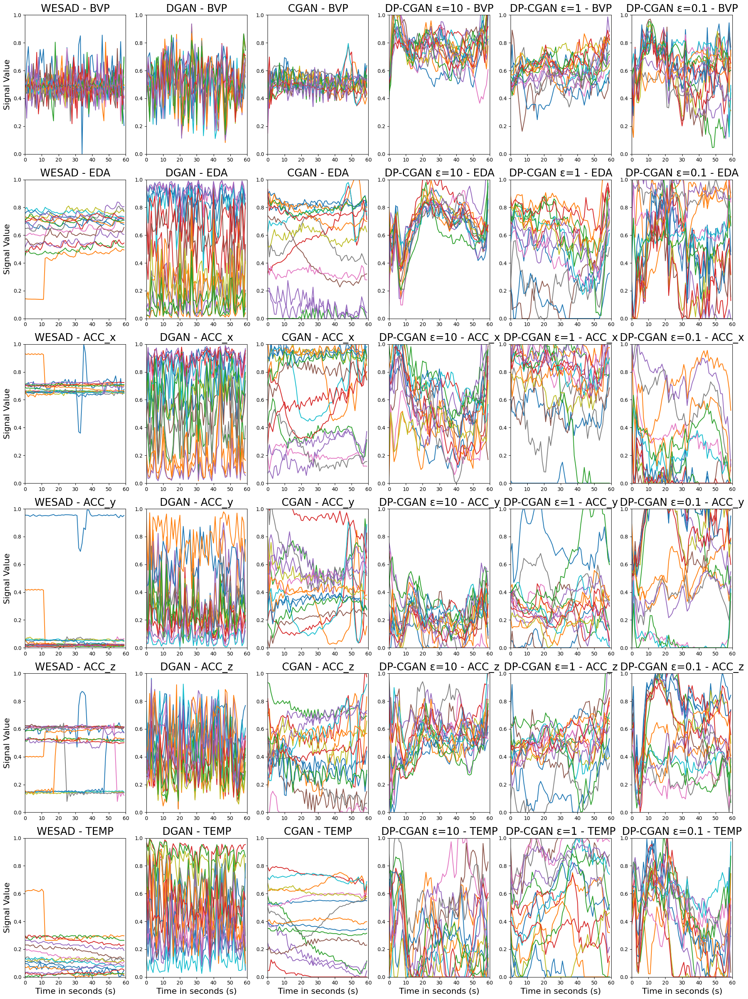

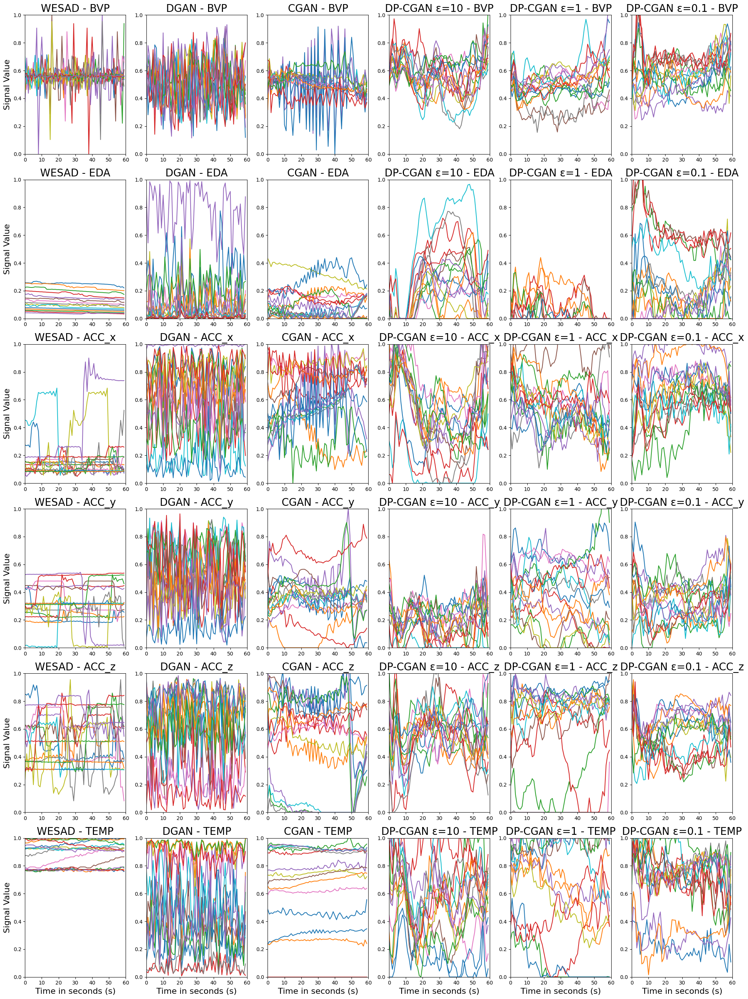

In [9]:
plt.style.use('default')
def plot_signals(datasets, label):
    num_samples = 15
    ITOSIG = {0: 'BVP', 1: 'EDA', 2: 'ACC_x', 3: 'ACC_y', 4: 'ACC_z', 5: 'TEMP'}

    fig, axes = plt.subplots(len(ITOSIG), len(datasets), figsize=(20, 27))
    axes = axes.flatten()

    # Set the vertical spacing between subplots
    plt.subplots_adjust(hspace=0.4)

    # Looping through each signal
    for i, signal in ITOSIG.items():

        # Looping through each dataset
        for offset, ds in enumerate(datasets):
            ds_name = ds[0]
            ds_data = ds[1][60:60+num_samples, :, :]

            ax = axes[i*len(datasets)+offset] # axis +0 at start and then next axis for each ds

            for j in range(num_samples):  # Plotting 10 samples per signal
                ax.plot(ds_data[j, :, i], label=f'Sample {j+60}')
    
            ax.set_title(f'{ds_name} - {signal}', fontsize=20)
            if offset == 0:
                ax.set_ylabel('Signal Value', fontsize=16)
            ax.set_xlim([0, 60])
            ax.set_ylim([0, 1])  # Set the y-axis limit from 0 to 1
    
            # Check if it's the last row of the column
            if i == len(ITOSIG) - 1:
                ax.set_xlabel('Time in seconds (s)', fontsize=16)  # Set x label for last row of column

    plt.tight_layout()
    if save_figs:
        plt.savefig(f"{RESULTS_PATH}/{label}_signals_windows.pdf", format="pdf", bbox_inches="tight")
    plt.show()

plot_signals([(windows[key]["name"], windows[key]["mos"]) for key, value in windows.items()], 'mos')
plot_signals([(windows[key]["name"], windows[key]["non_mos"]) for key, value in windows.items()], 'non_mos')


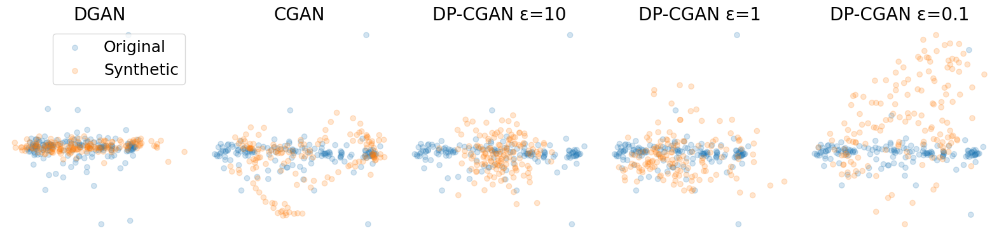

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 332 samples in 0.000s...
[t-SNE] Computed neighbors for 332 samples in 0.031s...
[t-SNE] Computed conditional probabilities for sample 332 / 332
[t-SNE] Mean sigma: 0.211227
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.275391
[t-SNE] KL divergence after 300 iterations: 0.341877
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 0.157635
[t-SNE] KL divergence after 250 iterations with early exaggeration: 45.448410
[t-SNE] KL divergence after 300 iterations: 0.234605
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 0.213680
[t-SNE] KL divergence after 250 iterati

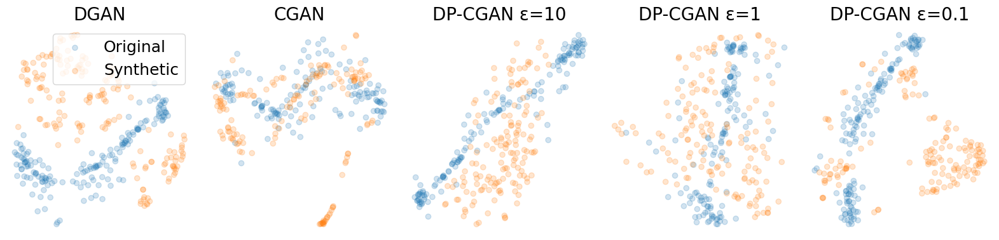

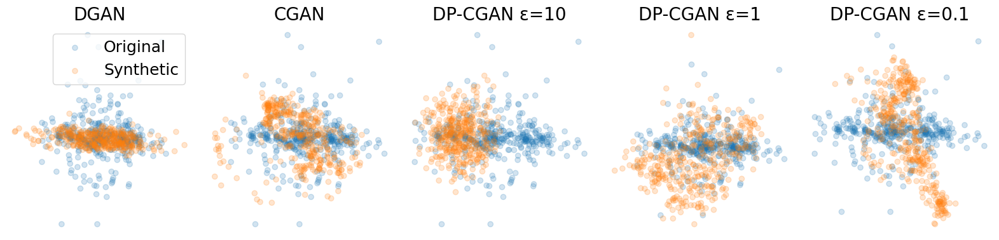

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 748 samples in 0.000s...
[t-SNE] Computed neighbors for 748 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 748 / 748
[t-SNE] Mean sigma: 0.125191
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.131721
[t-SNE] KL divergence after 300 iterations: 0.787102
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 750 samples in 0.000s...
[t-SNE] Computed neighbors for 750 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 750 / 750
[t-SNE] Mean sigma: 0.095572
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.382282
[t-SNE] KL divergence after 300 iterations: 0.535176
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 750 samples in 0.000s...
[t-SNE] Computed neighbors for 750 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 750 / 750
[t-SNE] Mean sigma: 0.116641
[t-SNE] KL divergence after 250 iterati

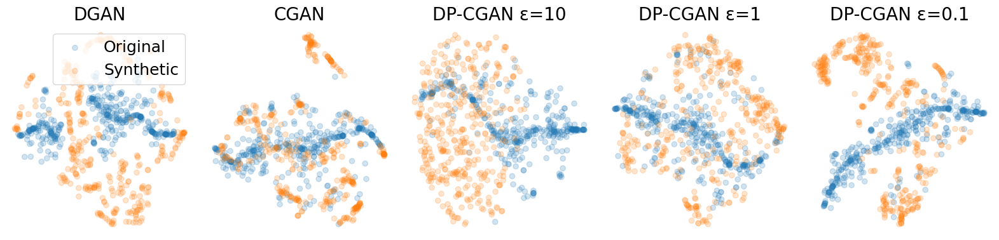

In [10]:
plt.style.use('default')
def visualization(ax, ori_data, generated_data, analysis, legendBool):
    """Using PCA or tSNE for generated and original data visualization.

    
    Args:
      - ax: matplotlib Axes object where the visualization will be added
      - ori_data: original data
      - generated_data: generated synthetic data
      - analysis: tsne or pca
    """

    # Change the global font size
    plt.rc('font', size=14)         # controls default text sizes
    plt.rc('axes', titlesize=14)    # fontsize of the axes title
    plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=16)   # fontsize of the tick labels
    plt.rc('ytick', labelsize=16)   # fontsize of the tick labels
    plt.rc('legend', fontsize=18)   # legend fontsize
    plt.rc('figure', titlesize=24)  # fontsize of the figure title


    anal_sample_no = min([1000, len(ori_data)])
    idx = np.random.permutation(len(ori_data))[:anal_sample_no]

    # Data preprocessing
    ori_data = np.asarray(ori_data)
    generated_data = np.asarray(generated_data)

    ori_data = ori_data[idx]
    generated_data = generated_data[idx]

    no, seq_len, dim = ori_data.shape

    for i in range(anal_sample_no):
        if i == 0:
            prep_data = np.reshape(np.mean(ori_data[0, :, :], 1), [1, seq_len])
            prep_data_hat = np.reshape(
                np.mean(generated_data[0, :, :], 1), [1, seq_len]
            )
        else:
            prep_data = np.concatenate(
                (prep_data, np.reshape(np.mean(ori_data[i, :, :], 1), [1, seq_len]))
            )
            prep_data_hat = np.concatenate(
                (
                    prep_data_hat,
                    np.reshape(np.mean(generated_data[i, :, :], 1), [1, seq_len]),
                )
            )

    colors = ["tab:blue" for i in range(anal_sample_no)] + [
        "tab:orange" for i in range(anal_sample_no)
    ]

    marker_size = None
    if analysis == "pca":
        # PCA Analysis
        pca = PCA(n_components=2)
        pca.fit(prep_data)
        pca_results = pca.transform(prep_data)
        pca_hat_results = pca.transform(prep_data_hat)

        ax.scatter(
            pca_results[:, 0],
            pca_results[:, 1],
            c=colors[:anal_sample_no],
            alpha=0.2,
            label="Original",
            s=marker_size
        )
        ax.scatter(
            pca_hat_results[:, 0],
            pca_hat_results[:, 1],
            c=colors[anal_sample_no:],
            alpha=0.2,
            label="Synthetic",
            s=marker_size
        )

    elif analysis == "tsne":
        prep_data_final = np.concatenate((prep_data, prep_data_hat), axis=0)

        tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
        tsne_results = tsne.fit_transform(prep_data_final)

        ax.scatter(
            tsne_results[:anal_sample_no, 0],
            tsne_results[:anal_sample_no, 1],
            c=colors[:anal_sample_no],
            alpha=0.2,
            label="Original",
            s=marker_size
        )
        ax.scatter(
            tsne_results[anal_sample_no:, 0],
            tsne_results[anal_sample_no:, 1],
            c=colors[anal_sample_no:],
            alpha=0.2,
            label="Synthetic",
            s=marker_size
        )

    if legendBool:
        ax.legend(loc="upper right")
    ax.set_title(f"{analysis} plot")
    ax.set_xlabel(f"x-{analysis}")
    ax.set_ylabel(f"y_{analysis}")
    ax.set_axis_off()

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import numpy as np

def multi_visualization(ori_data, generated_datasets, analyses, data_type):
    """Plot PCA or t-SNE for multiple datasets compared to original data.

    Args:
      - ori_data: original data
      - generated_datasets: list of generated synthetic data
      - analyses: list of 'tsne' or 'pca'
    """
    assert len(analyses) <= 2, "The function currently supports two types of analysis: 'tsne' or 'pca'."
  
    ITOSIG = {0: 'BVP', 1: 'EDA', 2: 'ACC_x', 3: 'ACC_y', 4: 'ACC_z', 5: 'TEMP'}

    for i, analysis in enumerate(analyses):
        fig, axs = plt.subplots(1, len(generated_datasets), figsize=(16, 4)) # Adjusted figure size
        
        for j, generated_tuple in enumerate(generated_datasets):
            legendBool = True if j==0 else False
            title = generated_tuple[0]
            generated_data = generated_tuple[1]
            visualization(axs[j], ori_data[:len(generated_data)], generated_data, analysis, legendBool)
            #axs[i, j].set_title(f'{title} - {analysis.upper()}', fontsize=20)
            axs[j].set_title(f'{title}', fontsize=20)

        plt.tight_layout()
        if save_figs:
            plt.savefig(f"{RESULTS_PATH}/{data_type}_{analysis}.pdf", format="pdf", bbox_inches="tight")
        plt.show()



multi_visualization(
    windows["WESAD"]["mos"], 
    [(windows[key]["name"], windows[key]["mos"]) for key, value in windows.items()][1:],
    ['pca', 'tsne'],
    'mos'
)

multi_visualization(
    windows["WESAD"]["non_mos"], 
    [(windows[key]["name"], windows[key]["non_mos"]) for key, value in windows.items()][1:], 
    ['pca', 'tsne'],
    'non_mos'
)


/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


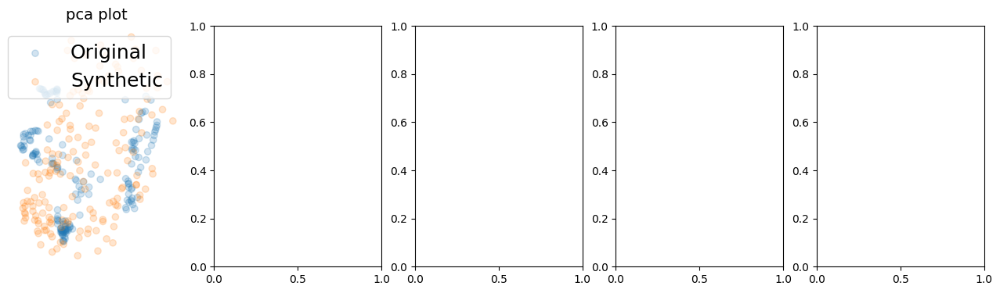

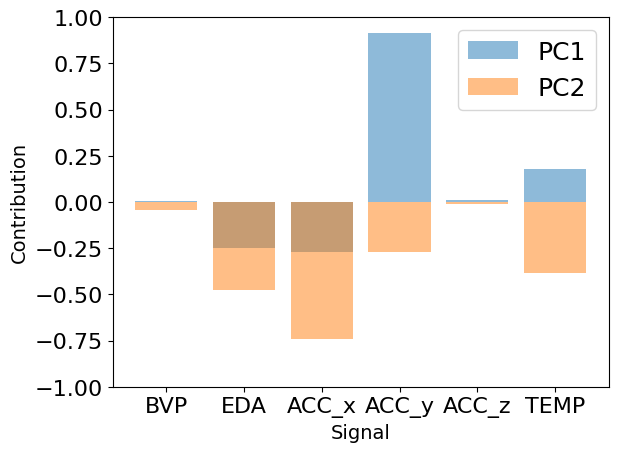

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


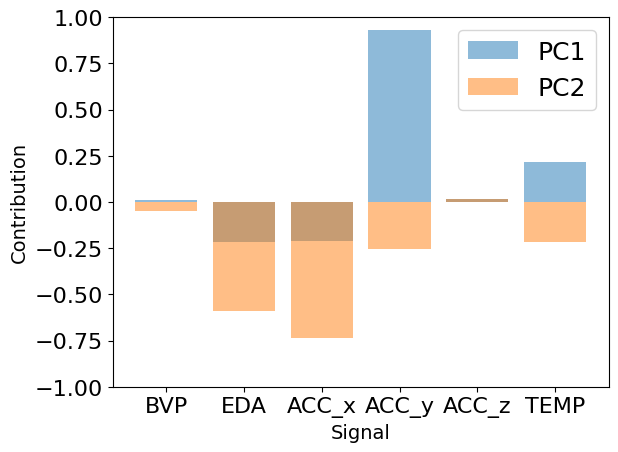

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


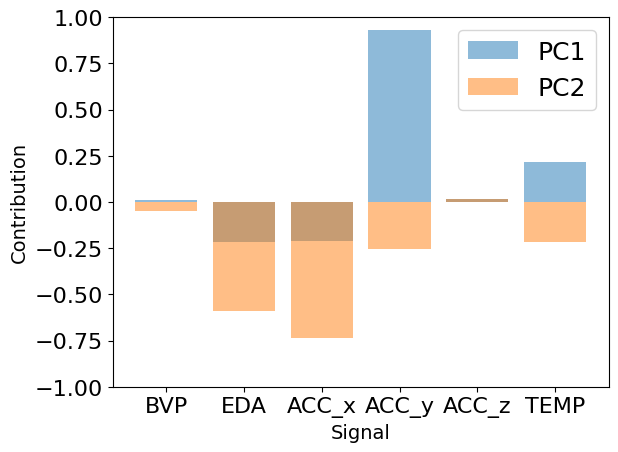

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


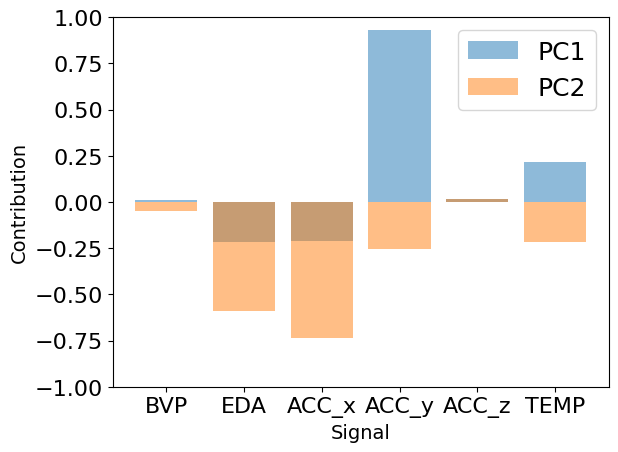

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


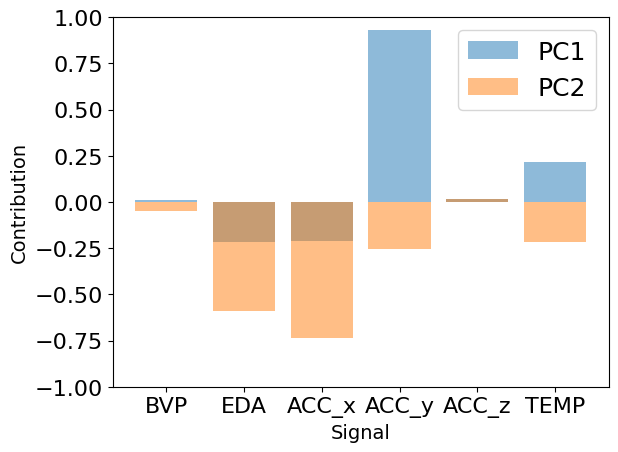

<Figure size 640x480 with 0 Axes>

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 332 samples in 0.000s...
[t-SNE] Computed neighbors for 332 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 332 / 332
[t-SNE] Mean sigma: 0.204410
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.799515
[t-SNE] KL divergence after 300 iterations: 0.341515
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 0.212347
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.129845
[t-SNE] KL divergence after 300 iterations: 0.195779
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 0.161354
[t-SNE] KL divergence after 250 iterati

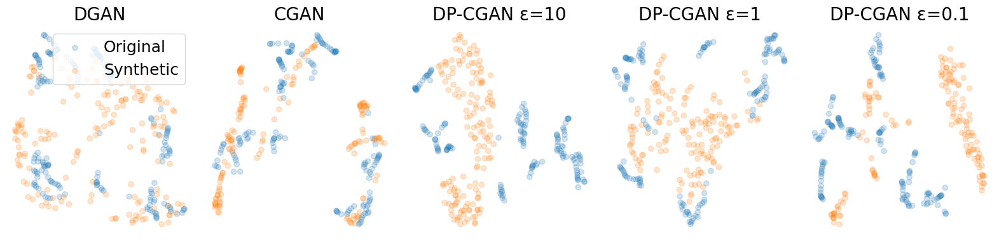

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


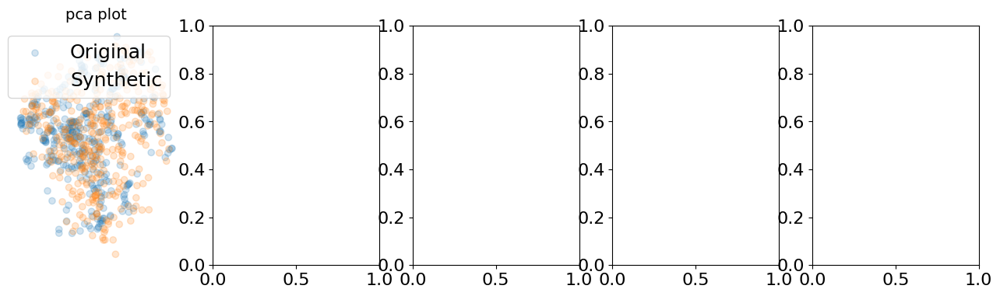

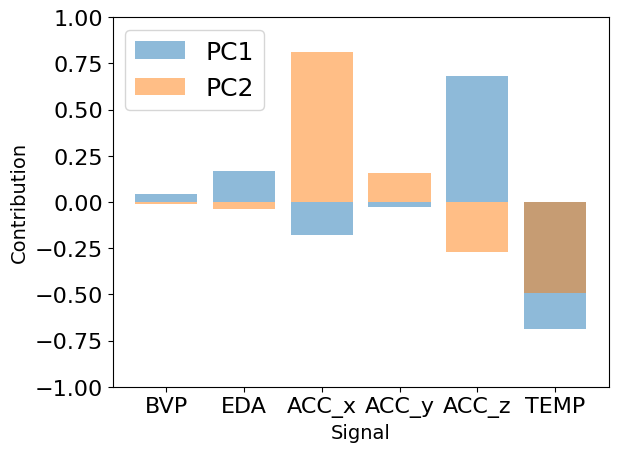

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


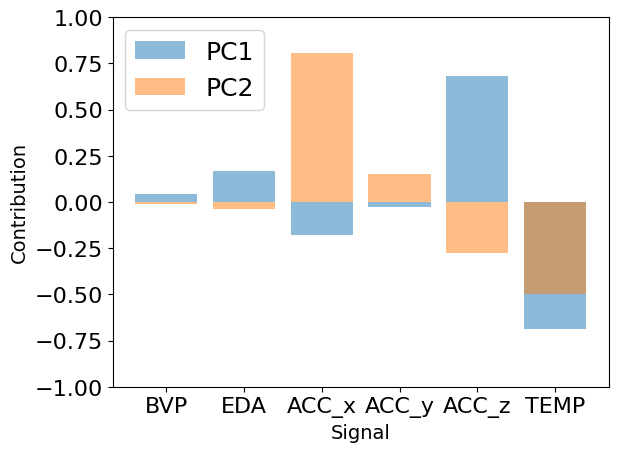

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


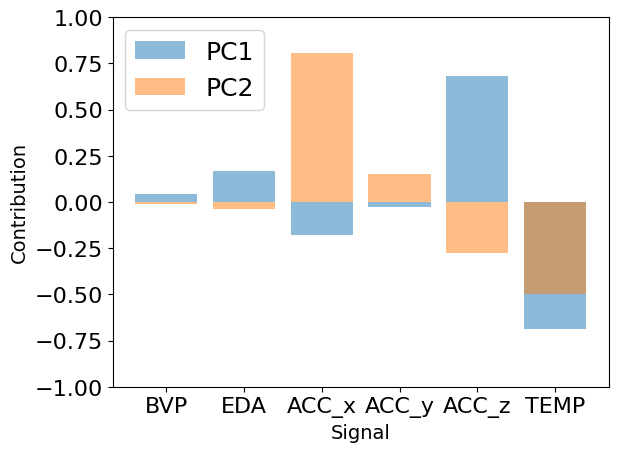

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


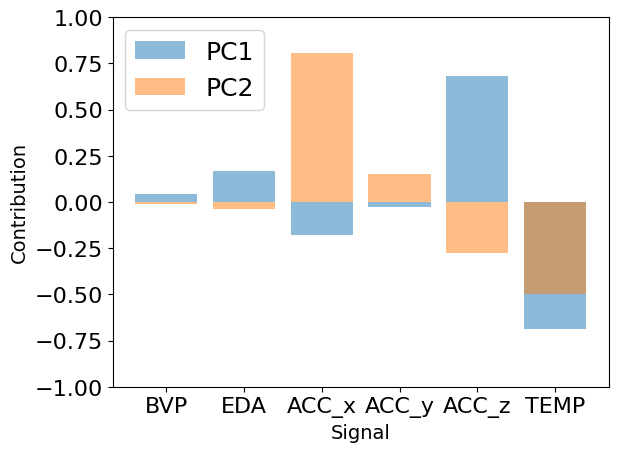

/var/folders/2b/2fvz2cwn55g6pcm2h7t_2s2m0000gn/T/ipykernel_62590/783950217.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


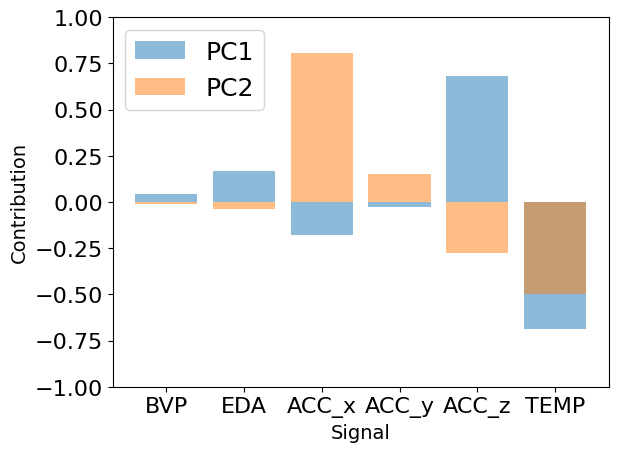

<Figure size 640x480 with 0 Axes>

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 748 samples in 0.000s...
[t-SNE] Computed neighbors for 748 samples in 0.012s...
[t-SNE] Computed conditional probabilities for sample 748 / 748
[t-SNE] Mean sigma: 0.161028
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.037167
[t-SNE] KL divergence after 300 iterations: 0.816251
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 750 samples in 0.000s...
[t-SNE] Computed neighbors for 750 samples in 0.012s...
[t-SNE] Computed conditional probabilities for sample 750 / 750
[t-SNE] Mean sigma: 0.141433
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.599781
[t-SNE] KL divergence after 300 iterations: 0.514500
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 750 samples in 0.000s...
[t-SNE] Computed neighbors for 750 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 750 / 750
[t-SNE] Mean sigma: 0.122418
[t-SNE] KL divergence after 250 iterati

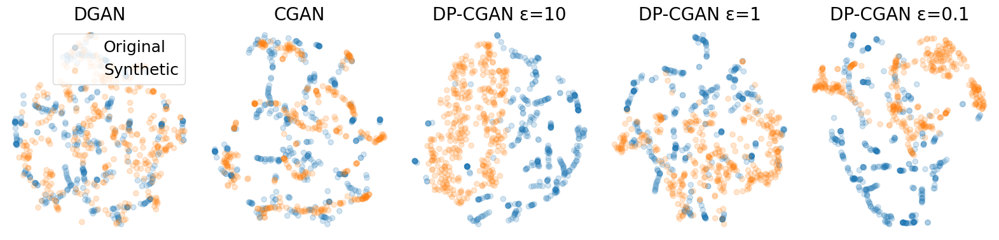

In [31]:
# PCA on the averages over 60 time points for all 6 signals
# instead the averages over all 6 signals and labels for 60 time points 
plot_feature_dis = True

plt.style.use('default')

def plot_feature_contributions(pca, ax):
    """Plot the feature contributions to the principal components."""
    features = range(pca.components_.shape[1])
    ax.bar(features, pca.components_[0], alpha=0.5, label='PC1')
    ax.bar(features, pca.components_[1], alpha=0.5, label='PC2')
    #ax.set_title('Signal contributions to the principal components')
    ax.set_xlabel('Signal')
    ax.set_ylabel('Contribution')
    ax.legend(loc='best')

    ax.set_ylim([-1, 1])
    
    labels = [item.get_text() for item in ax.get_xticklabels()]
    labels = [None, 'BVP', 'EDA', 'ACC_x', 'ACC_y', 'ACC_z', 'TEMP']
    ax.set_xticklabels(labels)

def visualization(ax, ori_data, generated_data, analysis, legendBool):
    """Using PCA or tSNE for generated and original data visualization.

    
    Args:
      - ax: matplotlib Axes object where the visualization will be added
      - ori_data: original data
      - generated_data: generated synthetic data
      - analysis: tsne or pca
    """

    # Change the global font size
    plt.rc('font', size=14)         # controls default text sizes
    plt.rc('axes', titlesize=14)    # fontsize of the axes title
    plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=16)   # fontsize of the tick labels
    plt.rc('ytick', labelsize=16)   # fontsize of the tick labels
    plt.rc('legend', fontsize=18)   # legend fontsize
    plt.rc('figure', titlesize=24)  # fontsize of the figure title


    anal_sample_no = min([1000, len(ori_data)])
    idx = np.random.permutation(len(ori_data))[:anal_sample_no]

    # Data preprocessing
    ori_data = np.asarray(ori_data)
    generated_data = np.asarray(generated_data)

    ori_data = ori_data[idx]
    generated_data = generated_data[idx]

    no, seq_len, dim = ori_data.shape

    for i in range(anal_sample_no):
        if i == 0:
            prep_data = np.reshape(np.mean(ori_data[0, :, :-1], 0), [1, dim-1])
            prep_data_hat = np.reshape(
                np.mean(generated_data[0, :, :-1], 0), [1, dim-1]
            )
        else:
            prep_data = np.concatenate(
                (prep_data, np.reshape(np.mean(ori_data[i, :, :-1], 0), [1, dim-1]))
            )
            prep_data_hat = np.concatenate(
                (
                    prep_data_hat,
                    np.reshape(np.mean(generated_data[i, :, :-1], 0), [1, dim-1]),
                )
            )

    colors = ["tab:blue" for i in range(anal_sample_no)] + [
        "tab:orange" for i in range(anal_sample_no)
    ]

    marker_size = None
    if analysis == "pca":
        # PCA Analysis
        pca = PCA(n_components=2)
        pca.fit(prep_data)
        pca_results = pca.transform(prep_data)
        pca_hat_results = pca.transform(prep_data_hat)

        ax.scatter(
            pca_results[:, 0],
            pca_results[:, 1],
            c=colors[:anal_sample_no],
            alpha=0.2,
            label="Original",
            s=marker_size
        )
        ax.scatter(
            pca_hat_results[:, 0],
            pca_hat_results[:, 1],
            c=colors[anal_sample_no:],
            alpha=0.2,
            label="Synthetic",
            s=marker_size
        )

    elif analysis == "tsne":
        prep_data_final = np.concatenate((prep_data, prep_data_hat), axis=0)

        tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
        tsne_results = tsne.fit_transform(prep_data_final)

        ax.scatter(
            tsne_results[:anal_sample_no, 0],
            tsne_results[:anal_sample_no, 1],
            c=colors[:anal_sample_no],
            alpha=0.2,
            label="Original",
            s=marker_size
        )
        ax.scatter(
            tsne_results[anal_sample_no:, 0],
            tsne_results[anal_sample_no:, 1],
            c=colors[anal_sample_no:],
            alpha=0.2,
            label="Synthetic",
            s=marker_size
        )

    if legendBool:
        ax.legend(loc="upper right")
    ax.set_title(f"{analysis} plot")
    ax.set_xlabel(f"x-{analysis}")
    ax.set_ylabel(f"y_{analysis}")
    ax.set_axis_off()

    if analysis == "pca":
        return pca
    else:
        return False

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import numpy as np

def multi_visualization(ori_data, generated_datasets, analyses, data_type):
    """Plot PCA or t-SNE for multiple datasets compared to original data.

    Args:
      - ori_data: original data
      - generated_datasets: list of generated synthetic data
      - analyses: list of 'tsne' or 'pca'
    """
    assert len(analyses) <= 2, "The function currently supports two types of analysis: 'tsne' or 'pca'."
  
    ITOSIG = {0: 'BVP', 1: 'EDA', 2: 'ACC_x', 3: 'ACC_y', 4: 'ACC_z', 5: 'TEMP'}

    for i, analysis in enumerate(analyses):
        fig, axs = plt.subplots(1, len(generated_datasets), figsize=(16, 4)) # Adjusted figure size
        
        for j, generated_tuple in enumerate(generated_datasets):
            legendBool = True if j==0 else False
            title = generated_tuple[0]
            generated_data = generated_tuple[1]
            pca = visualization(axs[j], ori_data[:len(generated_data)], generated_data, analysis, legendBool)
            
            # Create a new figure for the feature contributions
            if pca and plot_feature_dis:
                fig, contribution_ax = plt.subplots()
                plot_feature_contributions(pca, contribution_ax)
                if save_figs:
                    plt.savefig(f"{RESULTS_PATH}/{data_type}_{analysis}_distribution.pdf", format="pdf", bbox_inches="tight")
                plt.show()
            
            #axs[i, j].set_title(f'{title} - {analysis.upper()}', fontsize=20)
            axs[j].set_title(f'{title}', fontsize=20)

        plt.tight_layout()
        if save_figs:
            plt.savefig(f"{RESULTS_PATH}/{data_type}_{analysis}.pdf", format="pdf", bbox_inches="tight")
        plt.show()



multi_visualization(
    windows["WESAD"]["mos"], 
    [(windows[key]["name"], windows[key]["mos"]) for key, value in windows.items()][1:],
    ['pca', 'tsne'],
    'mos'
)

multi_visualization(
    windows["WESAD"]["non_mos"], 
    [(windows[key]["name"], windows[key]["non_mos"]) for key, value in windows.items()][1:], 
    ['pca', 'tsne'],
    'non_mos'
)


### 2. Fidelity

- Fidelity assessment aims to determine the extent to which the generated synthetic data closely resembles the statistical characteristics of the real data.
- High fidelity indicates that the generated data exhibits similar distributional properties, correlation structures, and higher-order statistical features as the original data, making it challenging to distinguish between them.
- This statistical evaluation provides a quantitative measure of how well the synthetic data aligns with the real data in terms of their underlying distributions and statistical properties.
- To enhance the evaluation of fidelity, a indistinguishability test can be conducted to assess the statistical significance of any observed differences between the synthetic and real datasets.
- The indistinguishability test helps quantify the level of similarity between the datasets and provides additional evidence supporting the fidelity assessment.

### Correlation Analysis

In [12]:
from scipy.stats import pearsonr
import pandas as pd

def calculate_pvalues(df):
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            tmp = df[df[r].notnull() & df[c].notnull()]
            pvalues[r][c] = round(pearsonr(tmp[r], tmp[c])[1], 4)
    return pvalues

WESAD
            BVP       EDA     ACC_x     ACC_y     ACC_z      TEMP     Label
BVP    1.000000  0.084098  0.014299  0.024416  0.137905  0.057154 -0.002017
EDA    0.084098  1.000000  0.133465 -0.177775 -0.117489 -0.272499  0.775023
ACC_x  0.014299  0.133465  1.000000 -0.081516 -0.041334 -0.048327 -0.008393
ACC_y  0.024416 -0.177775 -0.081516  1.000000  0.095416  0.024825 -0.101661
ACC_z  0.137905 -0.117489 -0.041334  0.095416  1.000000 -0.046327 -0.182717
TEMP   0.057154 -0.272499 -0.048327  0.024825 -0.046327  1.000000 -0.353766
Label -0.002017  0.775023 -0.008393 -0.101661 -0.182717 -0.353766  1.000000
          BVP  EDA   ACC_x ACC_y ACC_z TEMP   Label
BVP       0.0  0.0  0.0003   0.0   0.0  0.0  0.6071
EDA       0.0  0.0     0.0   0.0   0.0  0.0     0.0
ACC_x  0.0003  0.0     0.0   0.0   0.0  0.0  0.0324
ACC_y     0.0  0.0     0.0   0.0   0.0  0.0     0.0
ACC_z     0.0  0.0     0.0   0.0   0.0  0.0     0.0
TEMP      0.0  0.0     0.0   0.0   0.0  0.0     0.0
Label  0.6071  0.0  0.

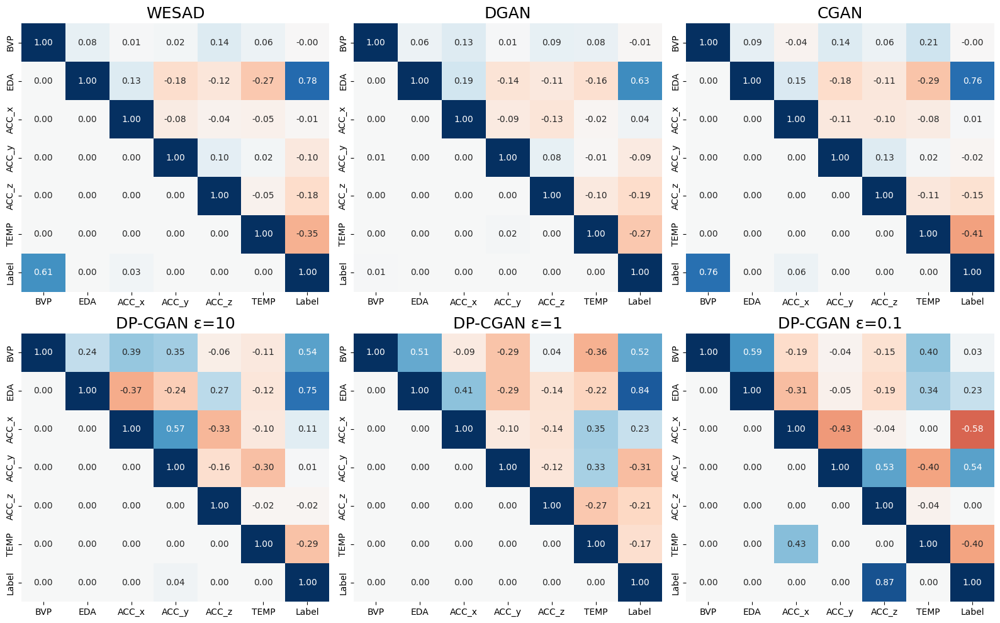

In [92]:
plt.style.use('default')
import matplotlib.pyplot as plt
import seaborn as sns

columns = ['BVP', 'EDA', 'ACC_x', 'ACC_y', 'ACC_z', 'TEMP', 'Label'] 
titles, dfs = [], []

for key, value in windows.items():
    titles.append(windows[key]["name"])
    dfs.append(pd.DataFrame(windows[key]["full"].reshape(-1, windows[key]["full"].shape[-1]), columns=columns))

fig, axs = plt.subplots(2, 3, figsize=(16, 10))

for ax, df, title in zip(axs.flatten(), dfs, titles):
    print(title)

    # correlation matrix
    corr_df = df.corr()
    print(corr_df)

    # p-value matrix
    p_df = calculate_pvalues(df)
    print(p_df)

    # right upper triangle correlations, lower triangle p-values, diagonal correlation
    corr_upper = corr_df.where(np.triu(np.ones(corr_df.shape)).astype(bool), other=0)
    p_lower = p_df.where(np.tril(np.ones(p_df.shape)).astype(bool), other=0)
    #p_lower_log = np.log10(p_lower)
    corr_p_df = (corr_upper + p_lower).astype(float)
    print(corr_p_df)
    sns.heatmap(corr_p_df, annot=True, fmt=".2f", cmap='RdBu', cbar=False, ax=ax, vmin=-1, vmax=1)
    ax.set_title(f'{title}', fontsize=18)

plt.tight_layout()
if save_figs:
    plt.savefig(f"{RESULTS_PATH}/correlation_p_values.pdf", format="pdf", bbox_inches="tight")
plt.show()


### Statistical Distribution

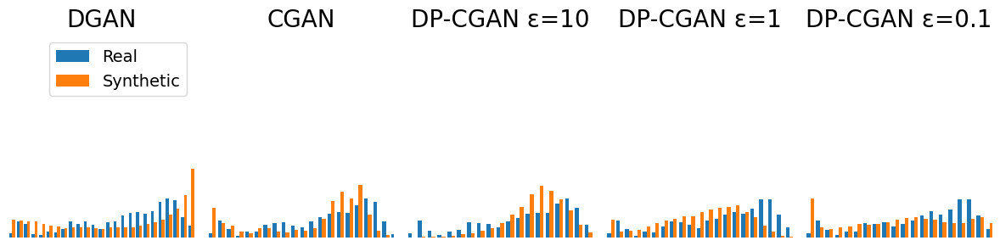

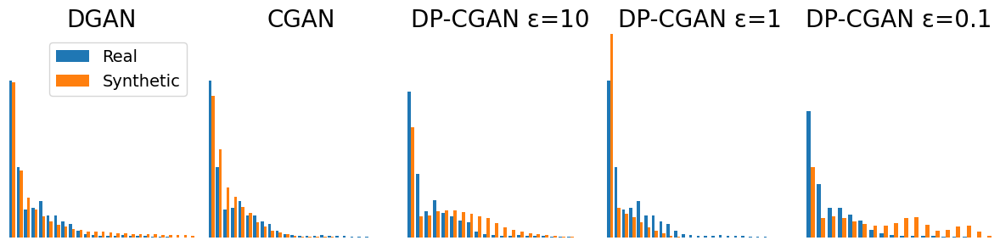

In [29]:
plt.style.use('default')
def plot_signal_distribution(ori_data, generated_datasets, data_type):
    """Plot signal distributions for different GANs.

    Args:
    - wesad_data: Real data.
    - cgan_data: Synthetic data from CGAN.
    - timegan_data: Synthetic data from TimeGAN.
    - dgan_data: Synthetic data from DGAN.
    - dp_cgan_data: Synthetic data from DP-CGAN.
    - data_type: A string indicating the type of data being plotted (either 'mos' or 'non_mos').
    """
    ITOSIG = {0: 'BVP', 1: 'EDA', 2: 'ACC_x', 3: 'ACC_y', 4: 'ACC_z', 5: 'TEMP'}

    fig, axs = plt.subplots(1, len(generated_datasets), figsize=(12, 3))
    axs = axs.flatten()

    # Set the vertical spacing between subplots
    plt.subplots_adjust(hspace=0.4)

    # Looping through each signal
    for i, signal in ITOSIG.items():
        if signal != "EDA":
            continue
        for j, gan in enumerate(generated_datasets):
            gan_name = gan[0]
            gan_data = gan[1]
            ax = axs[j]  # Set subplot
            ax.hist(
                [
                    np.array(ori_data[:, :, i]).flatten(),
                    np.array(gan_data[:, :, i]).flatten(),
                ],
                label=['Real', 'Synthetic'],
                bins=25,
                density=True,
            )
            if j==0:
                ax.legend(fontsize=14, loc="upper right")
            ax.set_xlim([0, 1])
            ax.set_ylim([0, 12])
            ax.set_title(f'{gan_name}', fontsize=20)

            ax.set_xlabel('Signal Value', fontsize=16)

            if j == 0:
                ax.set_ylabel('Density', fontsize=16)
            ax.set_axis_off()

    plt.tight_layout()
    if save_figs:
        plt.savefig(f"{RESULTS_PATH}/{data_type}_signals_distribution_eda.pdf", format="pdf", bbox_inches="tight")
    plt.show()

plot_signal_distribution(windows["WESAD"]["mos"],
                         [(windows[key]["name"], windows[key]["mos"]) for key, value in windows.items()][1:],
                         'mos')
plot_signal_distribution(windows["WESAD"]["non_mos"],
                         [(windows[key]["name"], windows[key]["non_mos"]) for key, value in windows.items()][1:],
                         'non_mos')


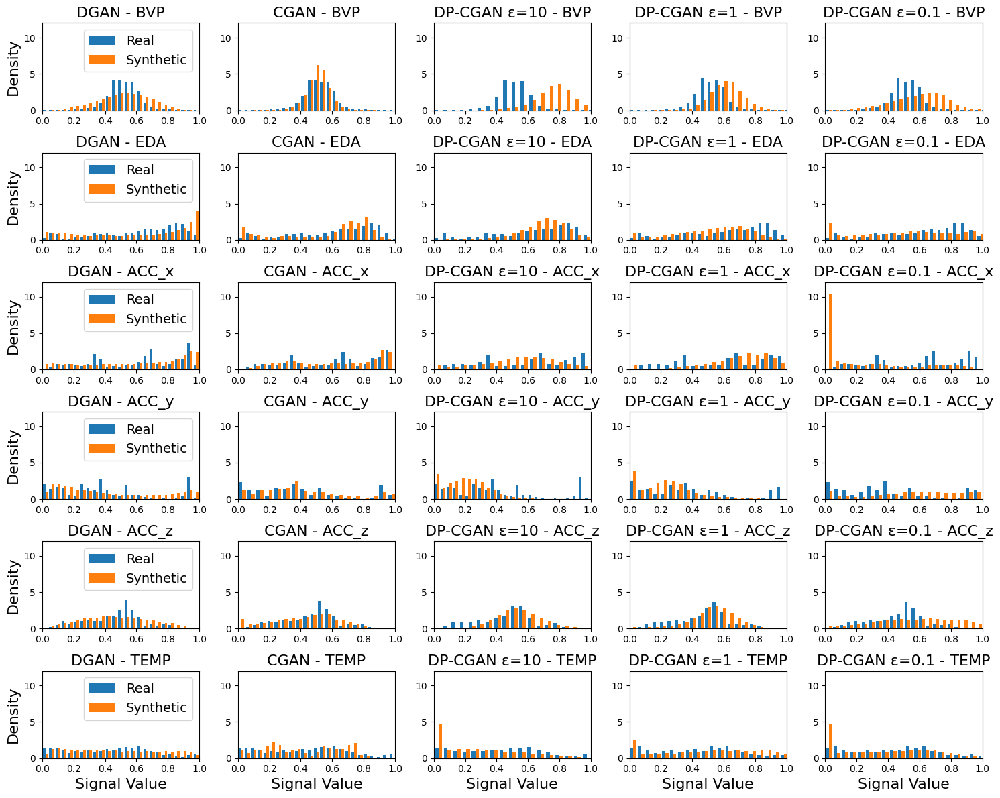

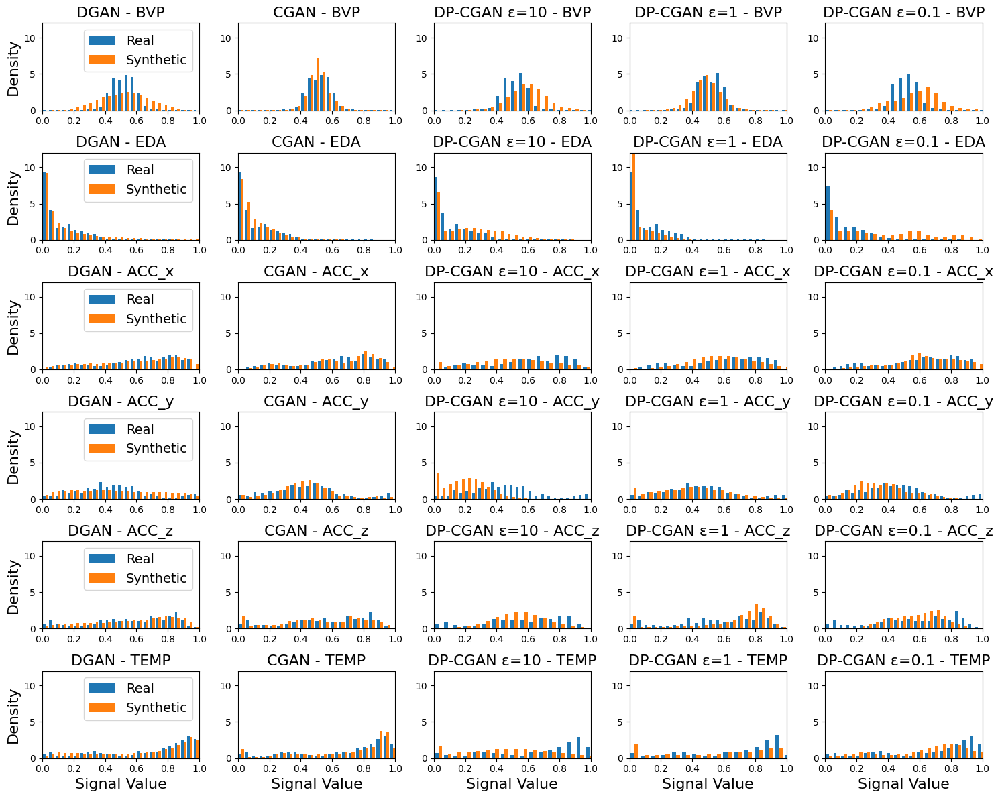

In [15]:
plt.style.use('default')
def plot_signal_distribution(ori_data, generated_datasets, data_type):
    """Plot signal distributions for different GANs.

    Args:
    - wesad_data: Real data.
    - cgan_data: Synthetic data from CGAN.
    - timegan_data: Synthetic data from TimeGAN.
    - dgan_data: Synthetic data from DGAN.
    - dp_cgan_data: Synthetic data from DP-CGAN.
    - data_type: A string indicating the type of data being plotted (either 'mos' or 'non_mos').
    """
    ITOSIG = {0: 'BVP', 1: 'EDA', 2: 'ACC_x', 3: 'ACC_y', 4: 'ACC_z', 5: 'TEMP'}

    fig, axs = plt.subplots(len(ITOSIG), len(generated_datasets), figsize=(15, 12))
    axs = axs.flatten()

    # Set the vertical spacing between subplots
    plt.subplots_adjust(hspace=0.4)

    # Looping through each signal
    for i, signal in ITOSIG.items():
        for j, gan in enumerate(generated_datasets):
            gan_name = gan[0]
            gan_data = gan[1]
            ax = axs[i*len(generated_datasets)+j]  # Set subplot
            ax.hist(
                [
                    np.array(ori_data[:, :, i]).flatten(),
                    np.array(gan_data[:, :, i]).flatten(),
                ],
                label=['Real', 'Synthetic'],
                bins=25,
                density=True,
            )
            if j==0:
                ax.legend(fontsize=14, loc="upper right")
            ax.set_xlim([0, 1])
            ax.set_ylim([0, 12])
            ax.set_title(f'{gan_name} - {signal}', fontsize=16)

            if i == len(ITOSIG) - 1:
                ax.set_xlabel('Signal Value', fontsize=16)

            if j == 0:
                ax.set_ylabel('Density', fontsize=16)

    plt.tight_layout()
    if save_figs:
        plt.savefig(f"{RESULTS_PATH}/{data_type}_signals_distribution.pdf", format="pdf", bbox_inches="tight")
    plt.show()


plot_signal_distribution(windows["WESAD"]["mos"],
                         [(windows[key]["name"], windows[key]["mos"]) for key, value in windows.items()][1:],
                         'mos')
plot_signal_distribution(windows["WESAD"]["non_mos"],
                         [(windows[key]["name"], windows[key]["non_mos"]) for key, value in windows.items()][1:],
                         'non_mos')


### Indistinguishability testing

In [16]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pandas as pd
import numpy as np

def select_classifier(classifier_type):
    if classifier_type == 'logistic_regression':
        return LogisticRegression(max_iter=1000, random_state=42)
    elif classifier_type == 'knn':
        return KNeighborsClassifier(2)
    elif classifier_type == 'naive_bayes':
        return GaussianNB()
    elif classifier_type == 'svc':
        return SVC(random_state=42)
    elif classifier_type == 'mlp':
        return MLPClassifier(random_state=42)
    else:
        raise ValueError(f'Unsupported classifier: {classifier_type}')

def preprocess_data(data, classifier, seq_length=60):
    reshaped_data = np.reshape(
        data, (data.shape[0], seq_length * data.shape[2]), order="F"
    )
    return pd.DataFrame(reshaped_data)


def indistinguishability_test(real_data_df, synthetic_data_df, clf):
    # Label the data
    real_labels = np.ones(len(real_data_df))
    synthetic_labels = np.zeros(len(synthetic_data_df))

    # Combine the data
    X = pd.concat([real_data_df, synthetic_data_df])
    y = np.concatenate([real_labels, synthetic_labels])

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train the classifier
    clf.fit(X_train, y_train)

    # Predict on the test set and calculate accuracy
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

def split_and_test(real_data, synthetic_data, classifier_name, clf, seq_length=60):
    if (pd.concat([real_data,synthetic_data]).drop_duplicates(keep=False)).empty: # TO TEST WESAD: because of halving needs double sequence length
        seq_length = 60
        
    # Split datasets into 'stress' and 'non-stress' subsets
    real_stress = real_data[real_data.iloc[:, -seq_length:].max(axis=1) == 1]
    real_non_stress = real_data[real_data.iloc[:, -seq_length:].max(axis=1) == 0]

    synthetic_stress = synthetic_data[synthetic_data.iloc[:, -seq_length:].max(axis=1) == 1]
    synthetic_non_stress = synthetic_data[synthetic_data.iloc[:, -seq_length:].max(axis=1) == 0]

    # TO TEST WESAD: compare ifferent halves of wesad as real and synthetic, then naive bayes only one thats perfect 0.5 on unseen wesad data
    if (pd.concat([real_data,synthetic_data]).drop_duplicates(keep=False)).empty:
        mid_stress = len(real_stress) // 2
        mid_non_stress = len(real_non_stress) // 2
        
        real_stress = real_stress.iloc[-mid_stress:]
        real_non_stress = real_non_stress.iloc[-mid_non_stress:]
        
        synthetic_stress = synthetic_stress.iloc[:mid_stress]
        synthetic_non_stress = synthetic_non_stress.iloc[:mid_non_stress]

    # Adjust the size of datasets so they are equal
    if len(real_stress) < len(synthetic_stress):
        synthetic_stress = synthetic_stress[:len(real_stress)]
    else:
        real_stress = real_stress[:len(synthetic_stress)]

    if len(real_non_stress) < len(synthetic_non_stress):
        synthetic_non_stress = synthetic_non_stress[:len(real_non_stress)]
    else:
        real_non_stress = real_non_stress[:len(synthetic_non_stress)]

    real_stress = real_stress.iloc[:, :-seq_length]
    real_non_stress = real_non_stress.iloc[:, :-seq_length]
    synthetic_stress = synthetic_stress.iloc[:, :-seq_length]
    synthetic_non_stress = synthetic_non_stress.iloc[:, :-seq_length]

    # Perform indistinguishability test on 'stress' subsets
    it_stress = indistinguishability_test(real_stress, synthetic_stress, clf) if len(real_stress) > 0 else None

    # Perform indistinguishability test on 'non-stress' subsets
    it_non_stress = indistinguishability_test(real_non_stress, synthetic_non_stress, clf) if len(real_non_stress) > 0 else None

    # TO TEST FOR BOTH STRESS AND NON-STRESS COMBINED
    # all = indistinguishability_test(pd.concat([real_stress, real_non_stress]), pd.concat([synthetic_stress, synthetic_non_stress]), clf)
    # it_stress = all
    # it_non_stress = all

    return it_stress, it_non_stress


from sklearn.preprocessing import MinMaxScaler

def test_classifiers_on_datasets(real_data_windows, generated_datasets):
    classifiers = ['naive_bayes'] # ['logistic_regression', 'knn', 'naive_bayes', 'svc', 'mlp']
    results = []
    
    # Create the scaler
    scaler = MinMaxScaler()

    for classifier_name in classifiers:
        print(f"\nTesting datasets on {classifier_name}...\n")
        
        for dataset_name, synthetic_data in generated_datasets:
            real_data_df = preprocess_data(real_data_windows, classifier_name)
            synthetic_data_df = preprocess_data(synthetic_data, classifier_name)
            
            # Scale the real data
            real_data_df = pd.DataFrame(scaler.fit_transform(real_data_df), columns=real_data_df.columns)

            # Scale the synthetic data
            synthetic_data_df = pd.DataFrame(scaler.transform(synthetic_data_df), columns=synthetic_data_df.columns)

            clf = select_classifier(classifier_name)
            
            it_stress, it_non_stress = split_and_test(real_data_df, synthetic_data_df, classifier_name, clf)

            if it_stress is not None:
                print(f'Accuracy of indistinguishability test for {dataset_name} using {classifier_name} (Stress): {it_stress:.3f}')
                results.append({'Classifier': classifier_name, 'Dataset': dataset_name, 'Stress_Type': 'Stress', 'Accuracy': it_stress})
            if it_non_stress is not None:
                print(f'Accuracy of indistinguishability test for {dataset_name} using {classifier_name} (Non-Stress): {it_non_stress:.3f}\n')
                results.append({'Classifier': classifier_name, 'Dataset': dataset_name, 'Stress_Type': 'Non-Stress', 'Accuracy': it_non_stress})

    results_df = pd.DataFrame(results)
    return results_df


In [17]:
# Running tests and storing results
results_df = test_classifiers_on_datasets(windows["WESAD"]["full"],
                                          [(windows[key]["name"], windows[key]["full"]) for key, value in windows.items()])#[1:])



Testing datasets on naive_bayes...

Accuracy of indistinguishability test for WESAD using naive_bayes (Stress): 0.725
Accuracy of indistinguishability test for WESAD using naive_bayes (Non-Stress): 0.696

Accuracy of indistinguishability test for DGAN using naive_bayes (Stress): 0.943
Accuracy of indistinguishability test for DGAN using naive_bayes (Non-Stress): 0.898

Accuracy of indistinguishability test for CGAN using naive_bayes (Stress): 0.767
Accuracy of indistinguishability test for CGAN using naive_bayes (Non-Stress): 0.713

Accuracy of indistinguishability test for DP-CGAN ε=10 using naive_bayes (Stress): 1.000
Accuracy of indistinguishability test for DP-CGAN ε=10 using naive_bayes (Non-Stress): 0.993

Accuracy of indistinguishability test for DP-CGAN ε=1 using naive_bayes (Stress): 0.900
Accuracy of indistinguishability test for DP-CGAN ε=1 using naive_bayes (Non-Stress): 0.833

Accuracy of indistinguishability test for DP-CGAN ε=0.1 using naive_bayes (Stress): 0.850
Accura

In [18]:
stress_df = results_df[results_df['Stress_Type'] == 'Stress']
non_stress_df = results_df[results_df['Stress_Type'] == 'Non-Stress']

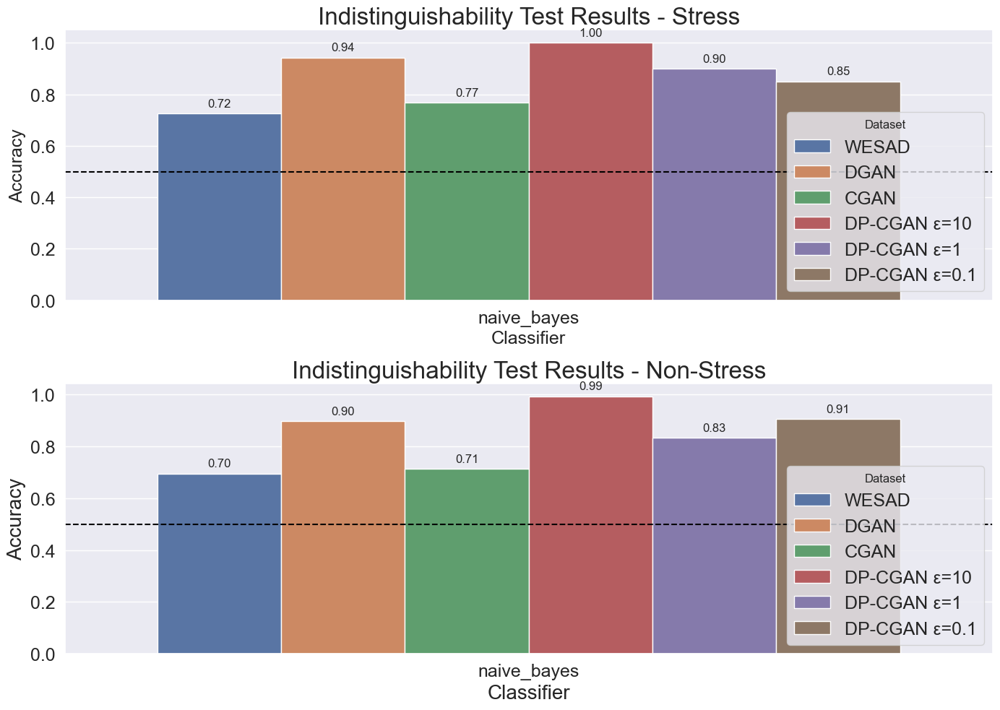

In [24]:
plt.style.use('default')
import seaborn as sns
import matplotlib.pyplot as plt

stress_df = results_df[results_df['Stress_Type'] == 'Stress']
non_stress_df = results_df[results_df['Stress_Type'] == 'Non-Stress']

sns.set(style="darkgrid")

plt.figure(figsize=(14, 10))
# plot stress data
plt.subplot(2, 1, 1)  # 2 rows, 1 column, first subplot
ax1 = sns.barplot(x="Classifier", y="Accuracy", hue="Dataset", data=stress_df)
plt.title('Indistinguishability Test Results - Stress', fontsize=24)
plt.xlabel('Classifier', fontsize=18)
plt.ylabel('Accuracy', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(title='Dataset', fontsize=18, loc="lower right")

for p in ax1.patches:
    ax1.annotate(format(p.get_height(), '.2f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()), 
                 ha='center', 
                 va='center', 
                 xytext=(0, 10), 
                 textcoords='offset points')

ax1.axhline(y=0.5, color='black', linestyle='--')

# plot non-stress data
plt.subplot(2, 1, 2)  # 2 rows, 1 column, second subplot
ax2 = sns.barplot(x="Classifier", y="Accuracy", hue="Dataset", data=non_stress_df)
plt.title('Indistinguishability Test Results - Non-Stress', fontsize=24)
plt.xlabel('Classifier', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(title='Dataset', fontsize=18, loc="lower right")

for p in ax2.patches:
    ax2.annotate(format(p.get_height(), '.2f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()), 
                 ha='center', 
                 va='center', 
                 xytext=(0, 10), 
                 textcoords='offset points')

# Draw a horizontal line at y = 0.5
ax2.axhline(y=0.5, color='black', linestyle='--')

plt.tight_layout()

if save_figs:
    plt.savefig(f"{RESULTS_PATH}/indistinguishability.pdf", format="pdf", bbox_inches="tight")
plt.show()


### 3. Usefulness—evaluate how well the generated data preserves the predictive characteristics of the original
Train on synthetic, test on real (TSTR) framework --> [05-Stress_Detection](05-Stress_Detection.ipynb)

### 4. spectrum plot + average spectral power per label + spectral power classifier (+ EDA classifier?)

In [121]:
from synthesizers.preprocessing.wesad import WESADDataset, LabelType
import pickle

new_preprocessing = False

if new_preprocessing:
    SAMPLING_RATE_new = 64
    wesad_path = os.path.expanduser("~") + "/Downloads/WESAD" # path to downloaded wesad dataset directory
    DATA_PATH_new = os.path.realpath(wesad_path)
    SUBJECT_NUMS = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
    
    wesad_dataset = WESADDataset(DATA_PATH_new, SUBJECT_NUMS)
    
    # dictionary of preprocessed dataframes for each subject
    wesad_subjects_dict = wesad_dataset.get_subject_dataframes(sampling_rate=SAMPLING_RATE_new, normalize=True)
    
    with open("stress_slurm/data/wesad_64hz.pickle", "wb") as f:
        real_data = pickle.dump(wesad_subjects_dict, f)

*** Adding real data from: WESAD ***


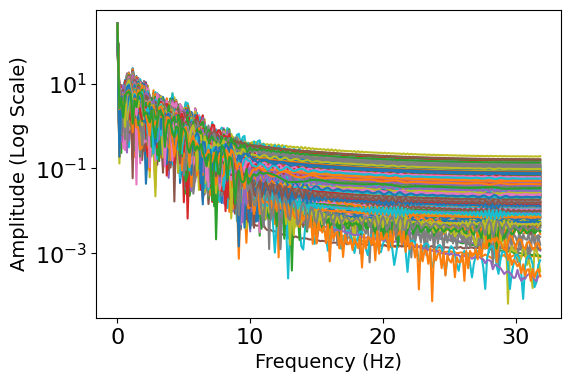

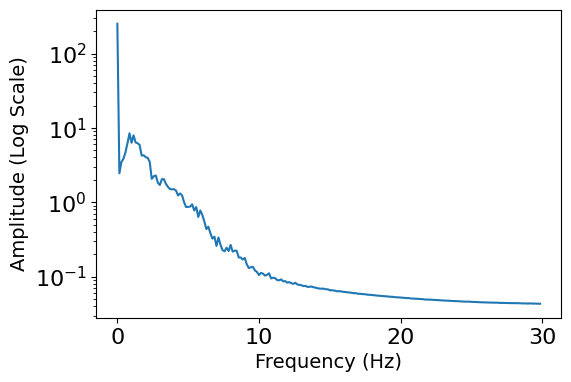

*** Loaded 1 real and 0 synthetic subjects ***



In [203]:
# spectrum plot
import stress_detector
import importlib
importlib.reload(stress_detector)
from stress_detector.preprocessing import load_data

## spectrum plots
# go into stress_detector/preprocessing.py and enter save path and change bool if figs should be saved
sampling_rate_loading = 64
_, _, _, _ = load_data(
    real_subj_cnt=1,
    real_path="stress_slurm/data/wesad_"+str(sampling_rate_loading)+"hz.pickle",
    syn_subj_cnt=0,
    syn_path=None,
    gan_mode=None,
    use_sliding_windows=False,
    sampling_rate=sampling_rate_loading,
    no_fft_plot=False
)

In [198]:
# spectrum plot + average spectral power per label + spectral power classifier
import stress_detector
import importlib
importlib.reload(stress_detector)
from stress_detector.preprocessing import load_data

## load data for other experiments
sampling_rate_loading = 1
realX, realY, synX, synY = load_data(
    real_subj_cnt=15,
    real_path="stress_slurm/data/wesad_"+str(sampling_rate_loading)+"hz.pickle",
    syn_subj_cnt=0,
    syn_path=None,
    gan_mode=None,
    use_sliding_windows=False,
    sampling_rate=sampling_rate_loading,
)

*** Adding real data from: WESAD ***
*** Loaded 15 real and 0 synthetic subjects ***



In [26]:
# from stress_detector.data.datatype import DataType
from random import shuffle
from typing import Tuple, Optional, Callable

import numpy as np
import tensorflow as tf
from sklearn.metrics import auc, confusion_matrix, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

import pandas as pd

from stress_detector import constants
from stress_detector.data.datatype import DataType
from stress_detector.model import build_cnn, build_transformer, build_cnn_lstm

import time
from datetime import timedelta


def train(
    realData: Tuple,
    signal_idxs = None,
    signal_coef_dict = {0: ('BVP', 3), 1: ('EDA', 3), 2: ('ACC_x', 3), 3: ('ACC_y', 15), 4: ('ACC_z', 15), 5: ('TEMP', 17)},
    plot_coef = False,
    print_intermediates = False
) -> dict:
    
    realX, realY = realData

    real_ids = ["S"+str(i) for i in constants.SUBJECT_IDS[:realX.shape[0]]]
    
    results = {}

    for test_idx in range(0, len(real_ids)):
        
        # if test_sub is not None:
        #     if test_sub_index != test_index:
        #         print("SKIP training for test_index", test_index)
        #         continue

        if print_intermediates:
            print(f"LOSO on {real_ids[test_idx]} from WESAD ({test_idx+1}/{len(real_ids)})...")
        start_time = time.monotonic()

        # get real training data without LOSO test subject
        X_train = np.concatenate(np.delete(realX, test_idx, 0))
        Y_train = np.concatenate(np.delete(realY, test_idx, 0))

        # test data is the removed LOSO test subject
        X_test = realX[test_idx]
        Y_test = realY[test_idx]

        # choose signals
        if len(signal_idxs) != 0:
            if len(signal_idxs) < 6:
                removal_idxs = list(set([i for i in range(0, 6)]) - set(signal_idxs))
                X_train = np.delete(X_train, removal_idxs, 1)
                X_test = np.delete(X_test, removal_idxs, 1)
        else: signal_idxs = [i for i in range(0, 6)]

        # reshape to not be seperated into signal arrays (aggregate signals)
        X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1]*X_train.shape[2]))
        X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1]*X_test.shape[2]))

        # Feature scaling
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        
        # Training
        classifier = LogisticRegression(max_iter=1000, random_state=42)
        classifier.fit(X_train, Y_train)
        y_pred = classifier.predict(X_test)
        
        # Calculating accuracy
        accuracy = accuracy_score(Y_test, y_pred)
        precision = precision_score(Y_test, y_pred)
        recall = recall_score(Y_test, y_pred)
        f1 = f1_score(Y_test, y_pred)

        # remove zeros and split for signals
        nonzero_coef = classifier.coef_[classifier.coef_ != 0]
        signal_coef_lens = [signal_coef_dict[x][1] for x in signal_idxs]
        signal_coef_slices = np.cumsum(signal_coef_lens)[:-1]
        split_coef = np.split(nonzero_coef, signal_coef_slices)
        # average to get coef
        averaged_coef = [np.mean(x) for x in split_coef]
        
        results[real_ids[test_idx]] = {
            "accuracy": accuracy,
            "precision": precision,
            "recall": recall,
            "f1": f1,
            "coefs": averaged_coef,
        }

        end_time = time.monotonic()
        if print_intermediates:
            print(f"--subj duration :{timedelta(seconds=end_time - start_time)}")

    df = pd.DataFrame.from_dict(results, orient='index', columns=["accuracy", "precision", "recall", "f1", "coefs"])
    df2 = df[['coefs']].copy()
    df = df.drop("coefs", axis=1) # remove coefs because its an array
    averages = df.mean(axis=0)
    if print_intermediates:
        print(f"***Subjects:\n{df}")
        print(f"***Averages:\n{averages}")

    coefs = np.array([np.array(x) for x in df2["coefs"].to_numpy()])
    avg_coef = coefs.mean(axis=0)
    
    results["average"] = {
        "accuracy": averages[0],
        "precision": averages[1],
        "recall": averages[2],
        "f1": averages[3],
        "coefs": avg_coef,
    }

    if plot_coef:
        signal_coef_names = [signal_coef_dict[x][0] for x in signal_idxs]
        coefs = pd.DataFrame(
            avg_coef, columns=["Coefficients"], index=signal_coef_names
        )
        
        coefs.plot(kind="barh", figsize=(6, 4))
        #plt.title("Ridge model")
        plt.axvline(x=0, color=".5")
        plt.subplots_adjust(left=0.3)
        if save_figs:
            plt.savefig(f"{RESULTS_PATH}/spectral_lr_coefs.pdf", format="pdf", bbox_inches="tight")

    return results

### LOSO spectral power classifier
# signal combination: ['BVP']


/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


f1= 28.07
# signal combination: ['BVP', 'EDA']
f1= 79.9
# signal combination: ['BVP', 'EDA', 'ACC_x']
f1= 81.38
# signal combination: ['BVP', 'EDA', 'ACC_x', 'ACC_y']
f1= 77.46
# signal combination: ['BVP', 'EDA', 'ACC_x', 'ACC_y', 'ACC_z']
f1= 77.91
# signal combination: ['BVP', 'EDA', 'ACC_x', 'ACC_y', 'ACC_z', 'TEMP']
f1= 76.79
# signal combination: ['EDA']
f1= 76.94
# signal combination: ['EDA', 'ACC_x']
f1= 78.56
# signal combination: ['EDA', 'ACC_x', 'ACC_y']
f1= 78.03
# signal combination: ['EDA', 'ACC_x', 'ACC_y', 'ACC_z']
f1= 77.33
# signal combination: ['EDA', 'ACC_x', 'ACC_y', 'ACC_z', 'TEMP']
f1= 75.32
# signal combination: ['ACC_x']
f1= 0.0
# signal combination: ['ACC_x', 'ACC_y']


/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: Undefi

f1= 15.44
# signal combination: ['ACC_x', 'ACC_y', 'ACC_z']


/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


f1= 20.76
# signal combination: ['ACC_x', 'ACC_y', 'ACC_z', 'TEMP']


/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


f1= 36.74
# signal combination: ['ACC_y']
f1= 16.73
# signal combination: ['ACC_y', 'ACC_z']


/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: Undefi

f1= 21.13
# signal combination: ['ACC_y', 'ACC_z', 'TEMP']


/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


f1= 36.86
# signal combination: ['ACC_z']
f1= 6.68
# signal combination: ['ACC_z', 'TEMP']


/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lucas/venv/GAN/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1344: Undefi

f1= 37.06
# signal combination: ['TEMP']
f1= 29.12
                                   f1
BVP                             28.07
BVP+EDA                         79.90
BVP+EDA+ACC_x                   81.38
BVP+EDA+ACC_x+ACC_y             77.46
BVP+EDA+ACC_x+ACC_y+ACC_z       77.91
BVP+EDA+ACC_x+ACC_y+ACC_z+TEMP  76.79
EDA                             76.94
EDA+ACC_x                       78.56
EDA+ACC_x+ACC_y                 78.03
EDA+ACC_x+ACC_y+ACC_z           77.33
EDA+ACC_x+ACC_y+ACC_z+TEMP      75.32
ACC_x                            0.00
ACC_x+ACC_y                     15.44
ACC_x+ACC_y+ACC_z               20.76
ACC_x+ACC_y+ACC_z+TEMP          36.74
ACC_y                           16.73
ACC_y+ACC_z                     21.13
ACC_y+ACC_z+TEMP                36.86
ACC_z                            6.68
ACC_z+TEMP                      37.06
TEMP                            29.12
### average spectral power per label
mean mos [0.01872195 0.02141641 0.02087415 0.06972935 0.0860617  0.07933722


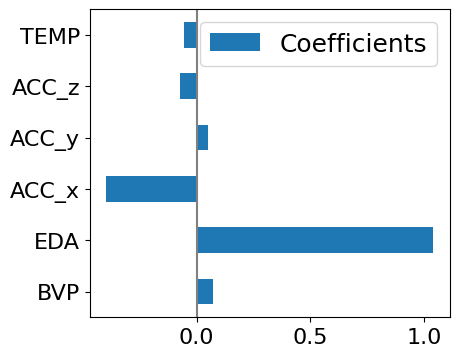

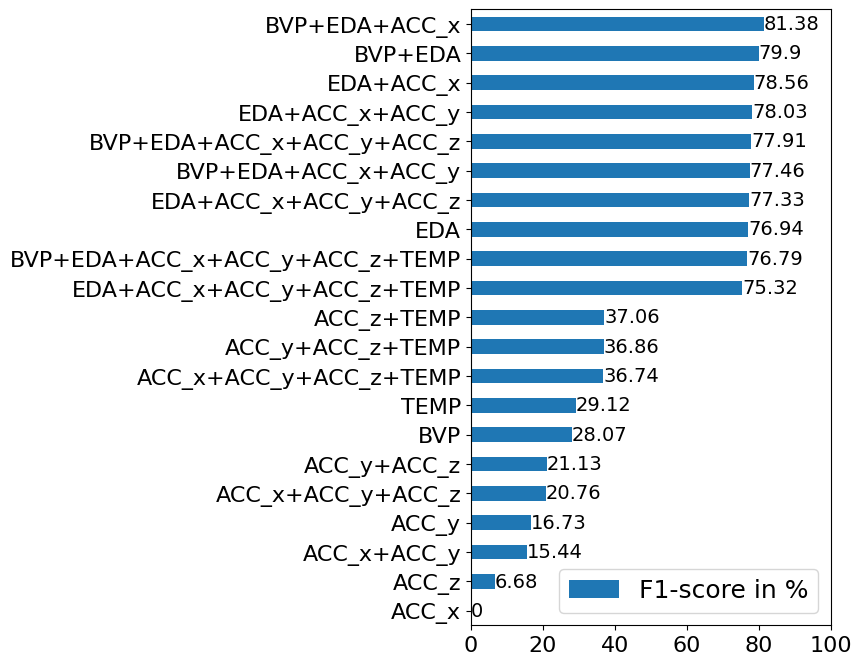

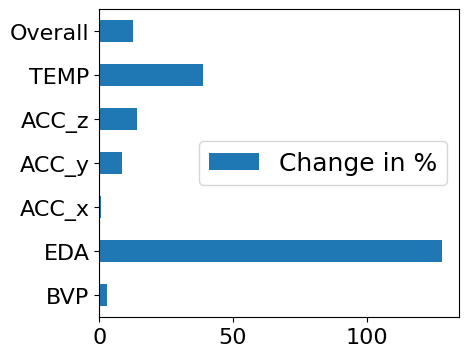

In [40]:
plt.style.use('default')
plt.rc('font', size=14)         # controls default text sizes
plt.rc('axes', titlesize=14)    # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)   # fontsize of the tick labels
plt.rc('ytick', labelsize=16)   # fontsize of the tick labels
plt.rc('legend', fontsize=18)   # legend fontsize
plt.rc('figure', titlesize=24)  # fontsize of the figure title

## 15 subjects with 530 windows each that each has all 6 signals with 210 data points each
subject_X = realX
subject_Y = realY
#print("subject level shape", subject_X.shape)
assert(subject_X.shape[0] == 15)

### LOSO spectral power classifier
print("### LOSO spectral power classifier")
ITOSIG = {0: ('BVP', 3), 1: ('EDA', 3), 2: ('ACC_x', 3), 3: ('ACC_y', 15), 4: ('ACC_z', 15), 5: ('TEMP', 17)}
res_df = pd.DataFrame(columns=["f1"])

signal_idx = [i for i in range(0,len(ITOSIG))]
for signal_idxs in [np.array(signal_idx[i:j]) for i in range(len(signal_idx)) for j in range(i + 1, len(signal_idx) + 1)]:
    print("# signal combination:", [ITOSIG[x][0] for x in signal_idxs])
    plot_coef = True if len(signal_idxs) == len(ITOSIG) else False
    results = train((subject_X, subject_Y), signal_idxs, signal_coef_dict=ITOSIG, plot_coef=plot_coef)
    f1 = round(results["average"]["f1"]*100,2)
    print("f1=",f1)
    res_df.loc['+'.join([ITOSIG[x][0] for x in signal_idxs])] = f1

print(res_df)

ax = res_df.sort_values(by="f1").plot(kind="barh", figsize=(6, 8))
ax.legend(labels=["F1-score in %"])
ax.bar_label(ax.containers[0])
plt.xlim([0, 100])
plt.subplots_adjust(left=0.3)
if save_figs:
    plt.savefig(f"{RESULTS_PATH}/spectral_lr_results.pdf", format="pdf", bbox_inches="tight")

## 530 windows that each has all 6 signals with 210 data points each
window_X = np.concatenate(subject_X)
window_Y = np.concatenate(subject_Y)
#print("window level shape", window_X.shape)
assert(window_X.shape[0] == 530 and window_X.shape[1] == 6 and window_X.shape[2] == 210)

### spectrum plot for window

## split windows by label
window_X_mos = [window_X[i] for i in range(len(window_X)) if window_Y[i]]
window_X_non_mos = [window_X[i] for i in range(len(window_X)) if (1-window_Y)[i]]

## 6 signals with all 530*210 frequency points (but split by label before)
signal_X_mos = np.concatenate(window_X_mos, axis=1)
signal_X_non_mos = np.concatenate(window_X_non_mos, axis=1)
#print("signal level shape", signal_X_mos.shape)
#print("signal level shape", signal_X_non_mos.shape)
assert(signal_X_mos.shape[1]+signal_X_non_mos.shape[1] == 530*210)

### average spectral power per label
print("### average spectral power per label")
means_mos = np.mean(signal_X_mos, axis=1)
means_non_mos = np.mean(signal_X_non_mos, axis=1)
means_mos = np.append(means_mos, np.mean(means_mos)) # add mean of all signals as last element
means_non_mos = np.append(means_non_mos, np.mean(means_non_mos)) # add mean of all signals as last element
print("mean mos",means_mos)
print("mean non mos",means_non_mos)
assert(means_mos.shape[0] == 7 and means_non_mos.shape[0] == 7)

## calculate percentage change using average because change is bi-directional (percentage change vs percantage difference)
## We use percentage change to calculate the change between any two values without specifying which one is the reference. This calculates the percentage change based on the average of the two values, which can be useful when comparing two numbers where neither is considered the "original" or "reference" value.
perc_change = [np.abs(np.round((( (x-y) / ((x+y)/2) ) * 100), 2)) for x,y in zip(means_mos,means_non_mos)]
print("percentage change between labels", perc_change)

signal_coef_names = [ITOSIG[x][0] for x in signal_idx]
signal_coef_names.append("Overall")
perc_change_df = pd.DataFrame(
    perc_change, columns=["Change in %"], index=signal_coef_names
)

ax = perc_change_df.plot(kind="barh", figsize=(6, 4))
plt.axvline(x=0, color=".5")
plt.subplots_adjust(left=0.3)
if save_figs:
    plt.savefig(f"{RESULTS_PATH}/average_spectral_power.pdf", format="pdf", bbox_inches="tight")